<h1> Amazon Apparel Recommendations </h1>



## Task

Build idfword2vec on Text containing all features (Text,color,Image,Brand) by one hot encoding.Give weights,Try Multiple weights Build weighted euclidean distance based similarity.


# [1.] Data and Code:
https://drive.google.com/open?id=0BwNkduBnePt2VWhCYXhMV3p4dTg



### [1.2] Overview of the data

In [1]:
#import all the necessary packages.

from PIL import Image
import requests
from io import BytesIO
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import warnings
from bs4 import BeautifulSoup
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import nltk
import math
import time
import re
import os
import seaborn as sns
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity  
from sklearn.metrics import pairwise_distances
from matplotlib import gridspec
from scipy.sparse import hstack
import plotly
import plotly.figure_factory as ff
from plotly.graph_objs import Scatter, Layout

plotly.offline.init_notebook_mode(connected=True)
warnings.filterwarnings("ignore")

In [2]:
data = pd.read_pickle('pickels/16k_apperal_data_preprocessed')
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies long sleeve stain resistant...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,womens unique 100 cotton special olympics wor...,$9.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies moisture free mesh sport sh...,$20.54
27,B014ICEJ1Q,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,supernatural chibis sam dean castiel neck tshi...,$7.39
46,B01NACPBG2,Fifth Degree,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,fifth degree womens gold foil graphic tees jun...,$6.95


## [2.] IDF Based Product Similarity

In [3]:
idf_title_vectorizer = CountVectorizer()
idf_title_features = idf_title_vectorizer.fit_transform(data['title'])

In [4]:
def n_containing(word):
    # return the number of documents which had the given word
    return sum(1 for blob in data['title'] if word in blob.split())

def idf(word):
    # idf = log(#number of docs / #number of docs which had the given word)
    return math.log(data.shape[0] / (n_containing(word)))

In [5]:
start_time = time.clock()

# we need to convert the values into float
idf_title_features  = idf_title_features.astype(np.float)

for i in idf_title_vectorizer.vocabulary_.keys():
    # for every word in whole corpus we will find its idf value
    idf_val = idf(i)
    
    # to calculate idf_title_features we need to replace the count values with the idf values of the word
    # idf_title_features[:, idf_title_vectorizer.vocabulary_[i]].nonzero()[0] will return all documents in which the word i present
    for j in idf_title_features[:, idf_title_vectorizer.vocabulary_[i]].nonzero()[0]:
        
        # we replace the count values of word i in document j with  idf_value of word i 
        # idf_title_features[doc_id, index_of_word_in_courpus] = idf value of word
        idf_title_features[j,idf_title_vectorizer.vocabulary_[i]] = idf_val

print(time.clock() - start_time, "seconds")

872.877288678004 seconds


In [6]:
# Utility Functions which we will use through the rest of the workshop.


#Display an image
def display_img(url,ax,fig):
    # we get the url of the apparel and download it
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    # we will display it in notebook 
    plt.imshow(img)
  
#plotting code to understand the algorithm's decision.
def plot_heatmap(keys, values, labels, url, text):
        # keys: list of words of recommended title
        # values: len(values) ==  len(keys), values(i) represents the occurence of the word keys(i)
        # labels: len(labels) == len(keys), the values of labels depends on the model we are using
                # if model == 'bag of words': labels(i) = values(i)
                # if model == 'tfidf weighted bag of words':labels(i) = tfidf(keys(i))
                # if model == 'idf weighted bag of words':labels(i) = idf(keys(i))
        # url : apparel's url

        # we will devide the whole figure into two parts
        gs = gridspec.GridSpec(2, 2, width_ratios=[4,1], height_ratios=[4,1]) 
        fig = plt.figure(figsize=(25,3))
        
        # 1st, ploting heat map that represents the count of commonly ocurred words in title2
        ax = plt.subplot(gs[0])
        # it displays a cell in white color if the word is intersection(lis of words of title1 and list of words of title2), in black if not
        ax = sns.heatmap(np.array([values]), annot=np.array([labels]))
        ax.set_xticklabels(keys) # set that axis labels as the words of title
        ax.set_title(text) # apparel title
        
        # 2nd, plotting image of the the apparel
        ax = plt.subplot(gs[1])
        # we don't want any grid lines for image and no labels on x-axis and y-axis
        ax.grid(False)
        ax.set_xticks([])
        ax.set_yticks([])
        
        # we call dispaly_img based with paramete url
        display_img(url, ax, fig)
        
        # displays combine figure ( heat map and image together)
        plt.show()
    
def plot_heatmap_image(doc_id, vec1, vec2, url, text, model):

    # doc_id : index of the title1
    # vec1 : input apparels's vector, it is of a dict type {word:count}
    # vec2 : recommended apparels's vector, it is of a dict type {word:count}
    # url : apparels image url
    # text: title of recomonded apparel (used to keep title of image)
    # model, it can be any of the models, 
        # 1. bag_of_words
        # 2. tfidf
        # 3. idf

    # we find the common words in both titles, because these only words contribute to the distance between two title vec's
    intersection = set(vec1.keys()) & set(vec2.keys()) 

    # we set the values of non intersecting words to zero, this is just to show the difference in heatmap
    for i in vec2:
        if i not in intersection:
            vec2[i]=0

    # for labeling heatmap, keys contains list of all words in title2
    keys = list(vec2.keys())
    #  if ith word in intersection(lis of words of title1 and list of words of title2): values(i)=count of that word in title2 else values(i)=0 
    values = [vec2[x] for x in vec2.keys()]
    
    # labels: len(labels) == len(keys), the values of labels depends on the model we are using
        # if model == 'bag of words': labels(i) = values(i)
        # if model == 'tfidf weighted bag of words':labels(i) = tfidf(keys(i))
        # if model == 'idf weighted bag of words':labels(i) = idf(keys(i))

    if model == 'bag_of_words':
        labels = values
    elif model == 'tfidf':
        labels = []
        for x in vec2.keys():
            # tfidf_title_vectorizer.vocabulary_ it contains all the words in the corpus
            # tfidf_title_features[doc_id, index_of_word_in_corpus] will give the tfidf value of word in given document (doc_id)
            if x in  tfidf_title_vectorizer.vocabulary_:
                labels.append(tfidf_title_features[doc_id, tfidf_title_vectorizer.vocabulary_[x]])
            else:
                labels.append(0)
    elif model == 'idf':
        labels = []
        for x in vec2.keys():
            # idf_title_vectorizer.vocabulary_ it contains all the words in the corpus
            # idf_title_features[doc_id, index_of_word_in_corpus] will give the idf value of word in given document (doc_id)
            if x in  idf_title_vectorizer.vocabulary_:
                labels.append(idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[x]])
            else:
                labels.append(0)

    plot_heatmap(keys, values, labels, url, text)


# this function gets a list of wrods along with the frequency of each 
# word given "text"
def text_to_vector(text):
    word = re.compile(r'\w+')
    words = word.findall(text)
    # words stores list of all words in given string, you can try 'words = text.split()' this will also gives same result
    return Counter(words) # Counter counts the occurence of each word in list, it returns dict type object {word1:count}



def get_result(doc_id, content_a, content_b, url, model):
    text1 = content_a
    text2 = content_b
    
    # vector1 = dict{word11:#count, word12:#count, etc.}
    vector1 = text_to_vector(text1)

    # vector1 = dict{word21:#count, word22:#count, etc.}
    vector2 = text_to_vector(text2)

    plot_heatmap_image(doc_id, vector1, vector2, url, text2, model)

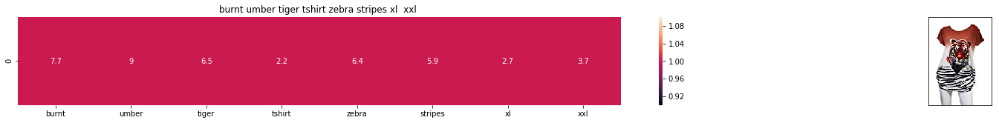

ASIN : B00JXQB5FQ
Brand : Si Row
Title of the product : burnt umber tiger tshirt zebra stripes xl  xxl 
Type : TOYS_AND_GAMES
euclidean distance from the given image : 0.0


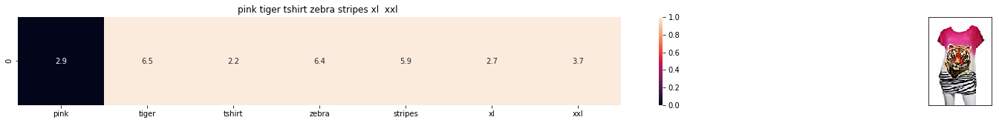

ASIN : B00JXQASS6
Brand : Si Row
Title of the product : pink tiger tshirt zebra stripes xl  xxl 
Type : TOYS_AND_GAMES
euclidean distance from the given image : 12.20507131122177


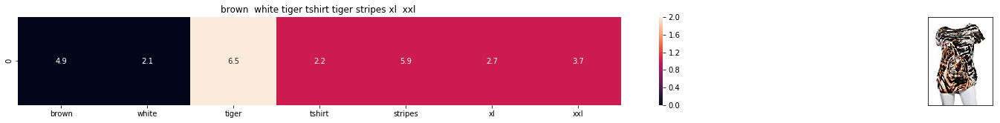

ASIN : B00JXQCWTO
Brand : Si Row
Title of the product : brown  white tiger tshirt tiger stripes xl  xxl 
Type : TOYS_AND_GAMES
euclidean distance from the given image : 14.468362685603465


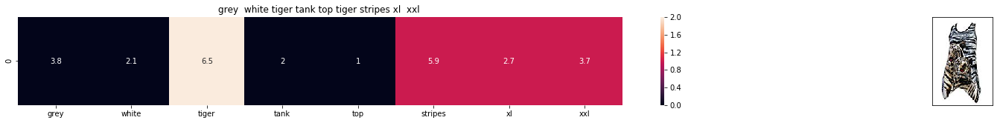

ASIN : B00JXQAFZ2
Brand : Si Row
Title of the product : grey  white tiger tank top tiger stripes xl  xxl 
Type : TOYS_AND_GAMES
euclidean distance from the given image : 14.486832924778964


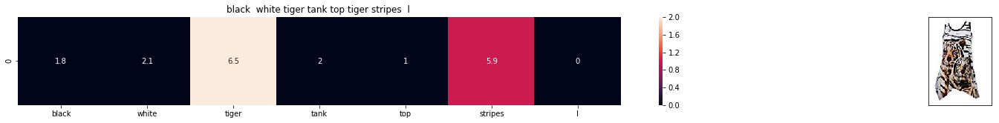

ASIN : B00JXQAO94
Brand : Si Row
Title of the product : black  white tiger tank top tiger stripes  l 
Type : TOYS_AND_GAMES
euclidean distance from the given image : 14.833392966672909


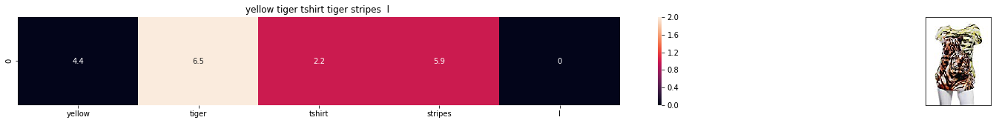

ASIN : B00JXQCUIC
Brand : Si Row
Title of the product : yellow tiger tshirt tiger stripes  l 
Type : TOYS_AND_GAMES
euclidean distance from the given image : 14.898744516719225


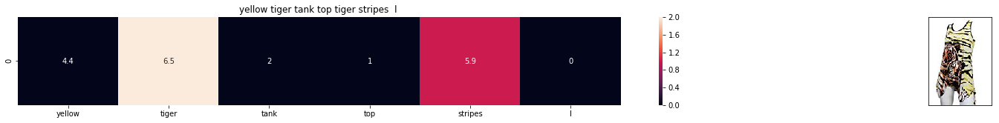

ASIN : B00JXQAUWA
Brand : Si Row
Title of the product : yellow tiger tank top tiger stripes  l 
Type : TOYS_AND_GAMES
euclidean distance from the given image : 15.224458287343769


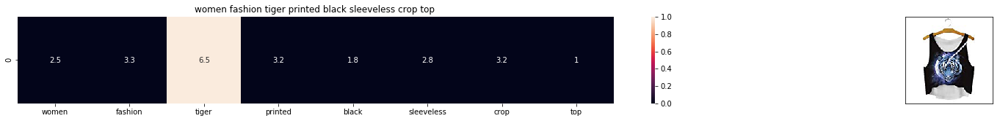

ASIN : B074T8ZYGX
Brand : MKP Crop Top
Title of the product : women fashion tiger printed black sleeveless crop top 
Type : SHIRT
euclidean distance from the given image : 17.080812955631995


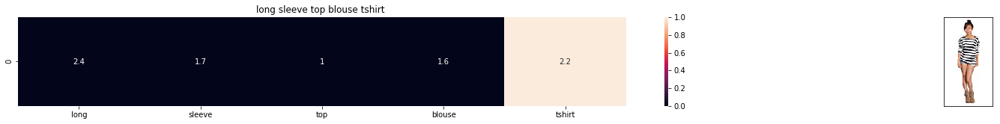

ASIN : B00KF2N5PU
Brand : Vietsbay
Title of the product : long sleeve top blouse tshirt 
Type : SHIRT
euclidean distance from the given image : 17.090168125645416


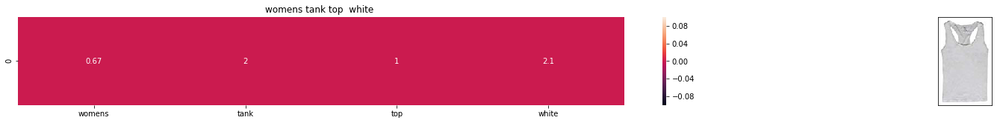

ASIN : B00JPOZ9GM
Brand : Sofra
Title of the product : womens tank top  white 
Type : SHIRT
euclidean distance from the given image : 17.153215337562703


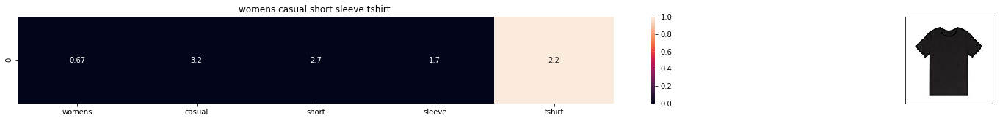

ASIN : B074T9KG9Q
Brand : Rain
Title of the product : womens casual short sleeve tshirt 
Type : SHIRT
euclidean distance from the given image : 17.33671523874989


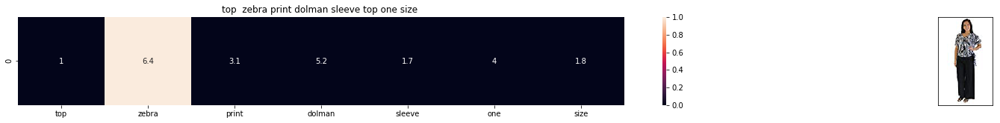

ASIN : B00H8A6ZLI
Brand : Vivian's Fashions
Title of the product : top  zebra print dolman sleeve top one size 
Type : SHIRT
euclidean distance from the given image : 17.410075941001253


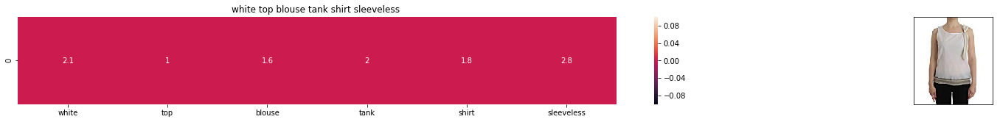

ASIN : B074G5G5RK
Brand : ERMANNO SCERVINO
Title of the product : white top blouse tank shirt sleeveless 
Type : SHIRT
euclidean distance from the given image : 17.539921335459557


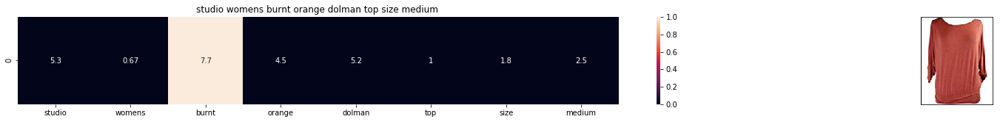

ASIN : B06XSCVFT5
Brand : Studio M
Title of the product : studio womens burnt orange dolman top size medium 
Type : SHIRT
euclidean distance from the given image : 17.61275854366134


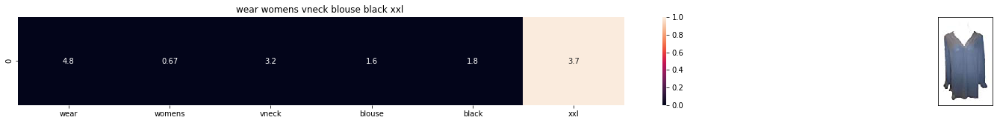

ASIN : B06Y6FH453
Brand : Who What Wear
Title of the product : wear womens vneck blouse black xxl 
Type : SHIRT
euclidean distance from the given image : 17.623745282500135


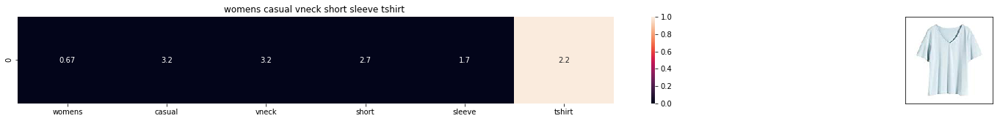

ASIN : B074V45DCX
Brand : Rain
Title of the product : womens casual vneck short sleeve tshirt 
Type : SHIRT
euclidean distance from the given image : 17.634342496835046


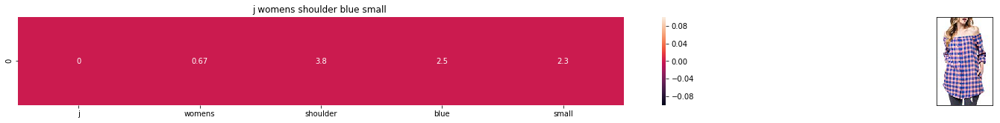

ASIN : B07583CQFT
Brand : Very J
Title of the product : j womens shoulder blue small 
Type : SHIRT
euclidean distance from the given image : 17.63753712743611


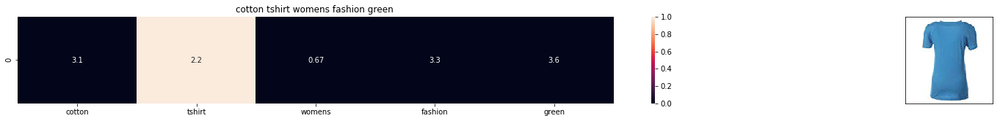

ASIN : B073GJGVBN
Brand : Ivan Levi
Title of the product : cotton tshirt womens fashion green 
Type : SHIRT
euclidean distance from the given image : 17.7230738913371


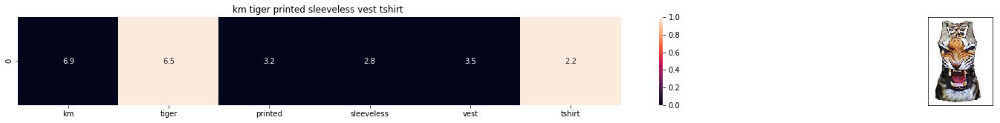

ASIN : B012VQLT6Y
Brand : KM T-shirt
Title of the product : km tiger printed sleeveless vest tshirt 
Type : SHIRT
euclidean distance from the given image : 17.762588561202364


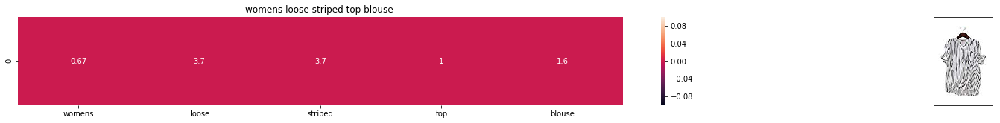

ASIN : B00ZZMYBRG
Brand : HP-LEISURE
Title of the product : womens loose striped top blouse 
Type : SHIRT
euclidean distance from the given image : 17.779536864674238


In [7]:
def idf_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(idf_title_features,idf_title_features[doc_id])

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])

    for i in range(0,len(indices)):
        get_result(indices[i],data['title'].loc[df_indices[0]], data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], 'idf')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('Title of the product :',data['title'].loc[df_indices[i]])
        print('Type :',data['product_type_name'].loc[df_indices[i]])
        print ('euclidean distance from the given image :', pdists[i])
        print('='*125)

        
        
idf_model(12566,20)
# in the output heat map each value represents the idf values of the label word, the color represents the intersection with inputs title

# [3] Text Semantics based product similarity

In [8]:
from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle
with open('word2vec_model', 'rb') as handle:
    model = pickle.load(handle)

In [9]:
# Utility functions

def get_word_vec(sentence, doc_id, m_name):
    # sentence : title of the apparel
    # doc_id: document id in our corpus
    # m_name: model information it will take two values
        # if  m_name == 'avg', we will append the model[i], w2v representation of word i
        # if m_name == 'weighted', we will multiply each w2v[word] with the idf(word)
    vec = []
    for i in sentence.split():
        if i in vocab:
            if m_name == 'weighted' and i in  idf_title_vectorizer.vocabulary_:
                vec.append(idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[i]] * model[i])
            elif m_name == 'avg':
                vec.append(model[i])
        else:
            # if the word in our courpus is not there in the google word2vec corpus, we are just ignoring it
            vec.append(np.zeros(shape=(300,)))
    # we will return a numpy array of shape (#number of words in title * 300 ) 300 = len(w2v_model[word])
    # each row represents the word2vec representation of each word (weighted/avg) in given sentance 
    return  np.array(vec)

def get_distance(vec1, vec2):
    # vec1 = np.array(#number_of_words_title1 * 300), each row is a vector of length 300 corresponds to each word in give title
    # vec2 = np.array(#number_of_words_title2 * 300), each row is a vector of length 300 corresponds to each word in give title
    
    final_dist = []
    # for each vector in vec1 we caluclate the distance(euclidean) to all vectors in vec2
    for i in vec1:
        dist = []
        for j in vec2:
            # np.linalg.norm(i-j) will result the euclidean distance between vectors i, j
            dist.append(np.linalg.norm(i-j))
        final_dist.append(np.array(dist))
    # final_dist = np.array(#number of words in title1 * #number of words in title2)
    # final_dist[i,j] = euclidean distance between vectors i, j
    return np.array(final_dist)


def heat_map_w2v(sentence1, sentence2, url, doc_id1, doc_id2, model):
    # sentance1 : title1, input apparel
    # sentance2 : title2, recommended apparel
    # url: apparel image url
    # doc_id1: document id of input apparel
    # doc_id2: document id of recommended apparel
    # model: it can have two values, 1. avg 2. weighted
    
    #s1_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s1_vec = get_word_vec(sentence1, doc_id1, model)
    #s2_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s2_vec = get_word_vec(sentence2, doc_id2, model)

    # s1_s2_dist = np.array(#number of words in title1 * #number of words in title2)
    # s1_s2_dist[i,j] = euclidean distance between words i, j
    s1_s2_dist = get_distance(s1_vec, s2_vec)

    
    
    # devide whole figure into 2 parts 1st part displays heatmap 2nd part displays image of apparel
    gs = gridspec.GridSpec(2, 2, width_ratios=[4,1],height_ratios=[2,1]) 
    fig = plt.figure(figsize=(15,15))
    
    ax = plt.subplot(gs[0])
    # ploting the heap map based on the pairwise distances
    ax = sns.heatmap(np.round(s1_s2_dist,4), annot=True)
    # set the x axis labels as recommended apparels title
    ax.set_xticklabels(sentence2.split())
    # set the y axis labels as input apparels title
    ax.set_yticklabels(sentence1.split())
    # set title as recommended apparels title
    ax.set_title(sentence2)
    
    ax = plt.subplot(gs[1])
    # we remove all grids and axis labels for image
    ax.grid(False)
    ax.set_xticks([])
    ax.set_yticks([])
    display_img(url, ax, fig)
    
    plt.show()

In [10]:
# vocab = stores all the words that are there in google w2v model
# vocab = model.wv.vocab.keys() # if you are using Google word2Vec

vocab = model.keys()
# this function will add the vectors of each word and returns the avg vector of given sentance
def build_avg_vec(sentence, num_features, doc_id, m_name):
    # sentace: its title of the apparel
    # num_features: the length of word2vec vector, its values = 300
    # m_name: model information it will take two values
        # if  m_name == 'avg', we will append the model[i], w2v representation of word i
        # if m_name == 'weighted', we will multiply each w2v[word] with the idf(word)

    featureVec = np.zeros((num_features,), dtype="float32")
    # we will intialize a vector of size 300 with all zeros
    # we add each word2vec(wordi) to this fetureVec
    nwords = 0
    
    for word in sentence.split():
        nwords += 1
        if word in vocab:
            if m_name == 'weighted' and word in  idf_title_vectorizer.vocabulary_:
                featureVec = np.add(featureVec, idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[word]] * model[word])
            elif m_name == 'avg':
                featureVec = np.add(featureVec, model[word])
    if(nwords>0):
        featureVec = np.divide(featureVec, nwords)
    # returns the avg vector of given sentance, its of shape (1, 300)
    return featureVec


### [4]  IDF weighted Word2Vec for product similarity

In [11]:
doc_id = 0
w2v_title_weight = []
# for every title we build a weighted vector representation
for i in data['title']:
    w2v_title_weight.append(build_avg_vec(i, 300, doc_id,'weighted'))
    doc_id += 1
# w2v_title = np.array(# number of doc in courpus * 300), each row corresponds to a doc 
w2v_title_weight = np.array(w2v_title_weight)

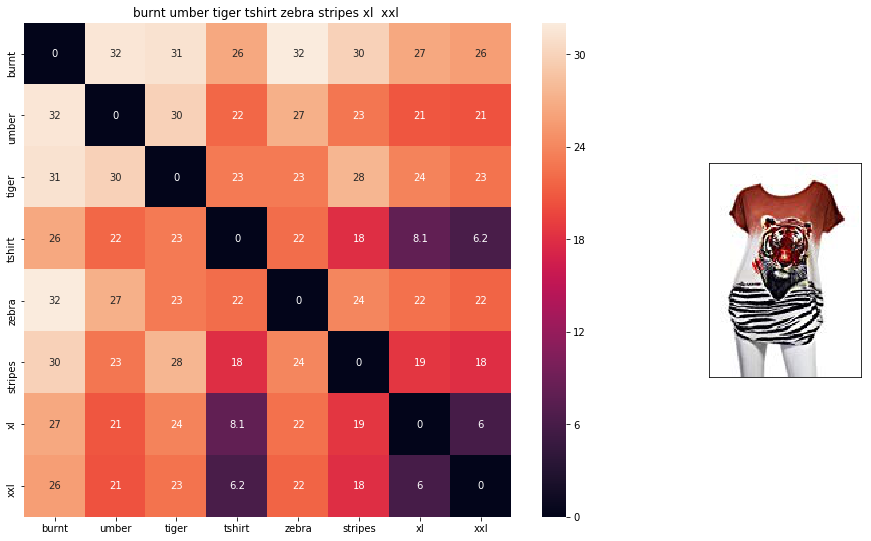

ASIN : B00JXQB5FQ
Brand : Si Row
euclidean distance from input : 0.00390625


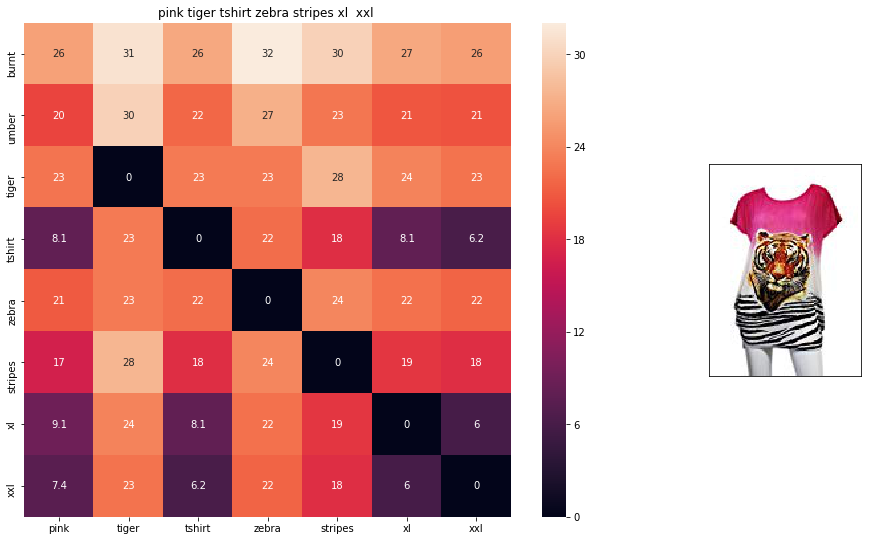

ASIN : B00JXQASS6
Brand : Si Row
euclidean distance from input : 4.0638885


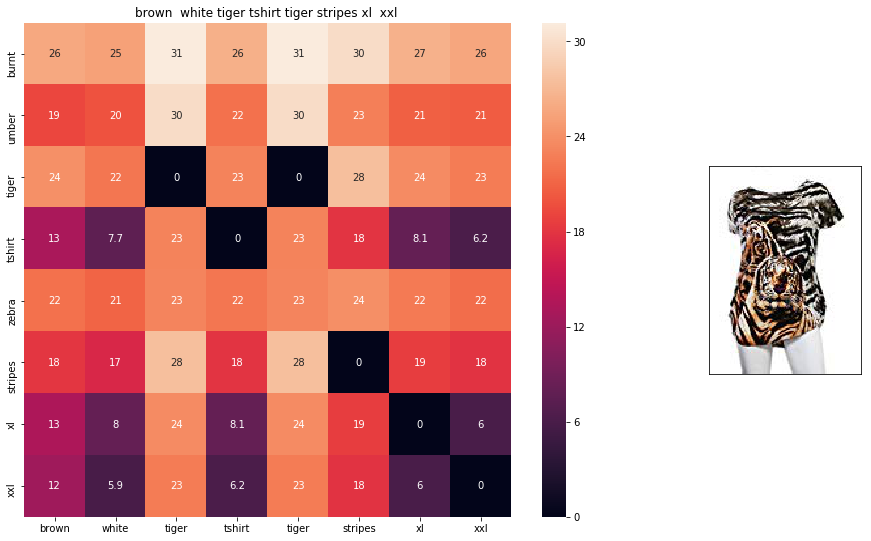

ASIN : B00JXQCWTO
Brand : Si Row
euclidean distance from input : 4.770942


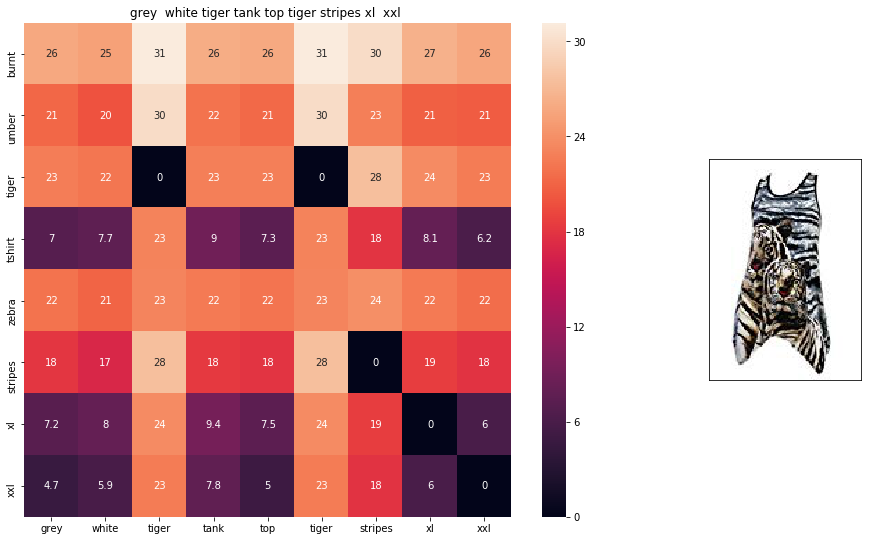

ASIN : B00JXQAFZ2
Brand : Si Row
euclidean distance from input : 5.360161


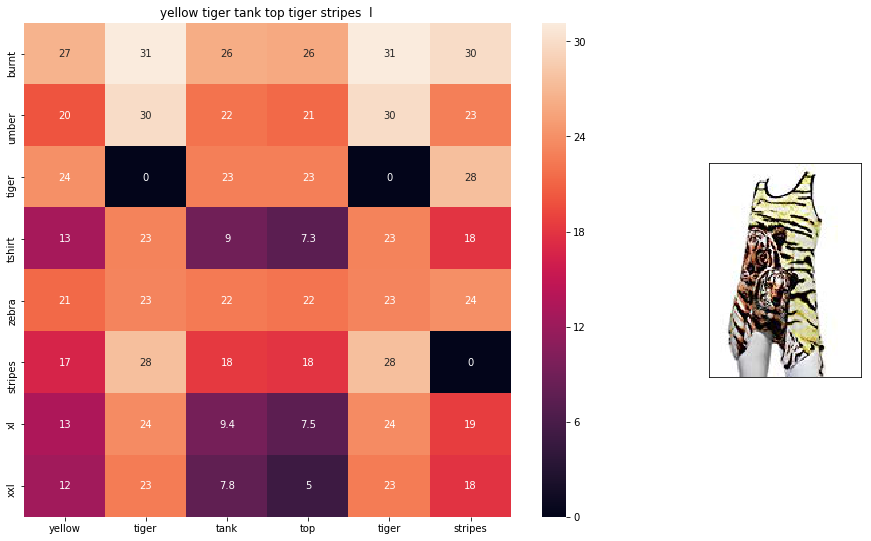

ASIN : B00JXQAUWA
Brand : Si Row
euclidean distance from input : 5.6895237


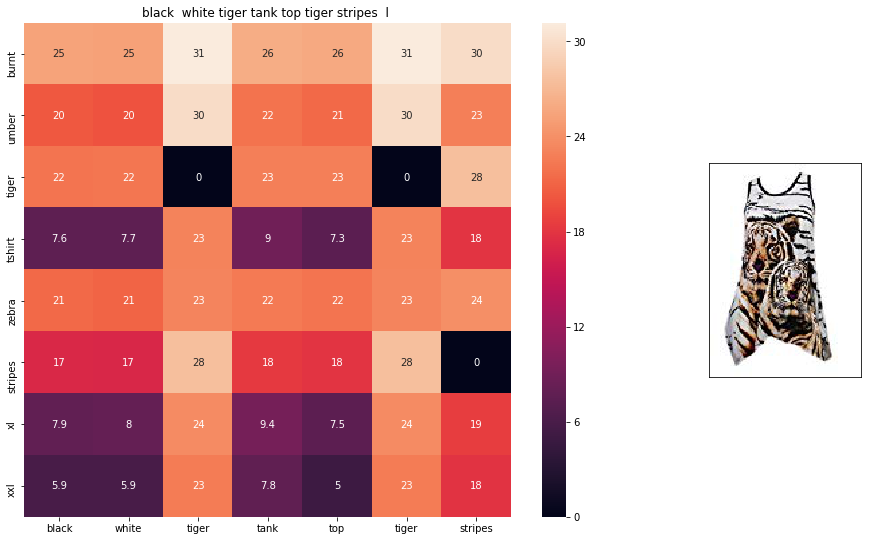

ASIN : B00JXQAO94
Brand : Si Row
euclidean distance from input : 5.6930213


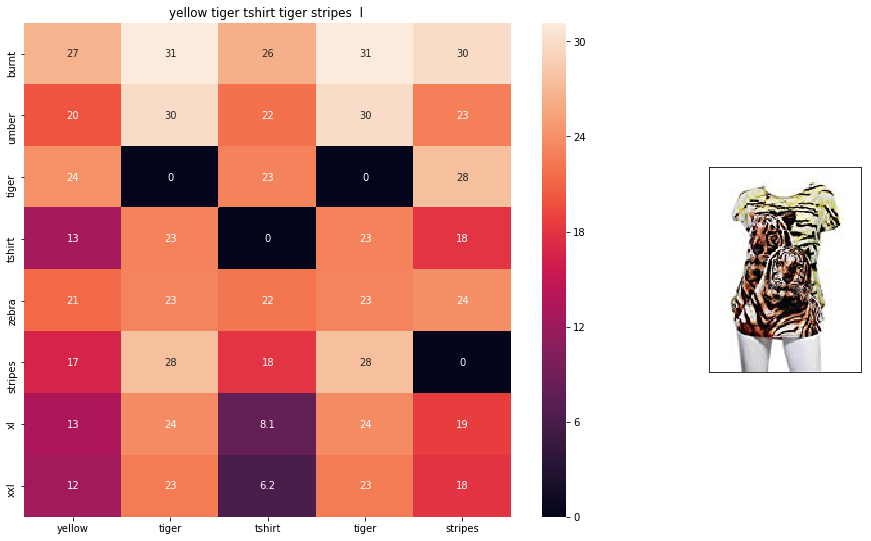

ASIN : B00JXQCUIC
Brand : Si Row
euclidean distance from input : 5.8934426


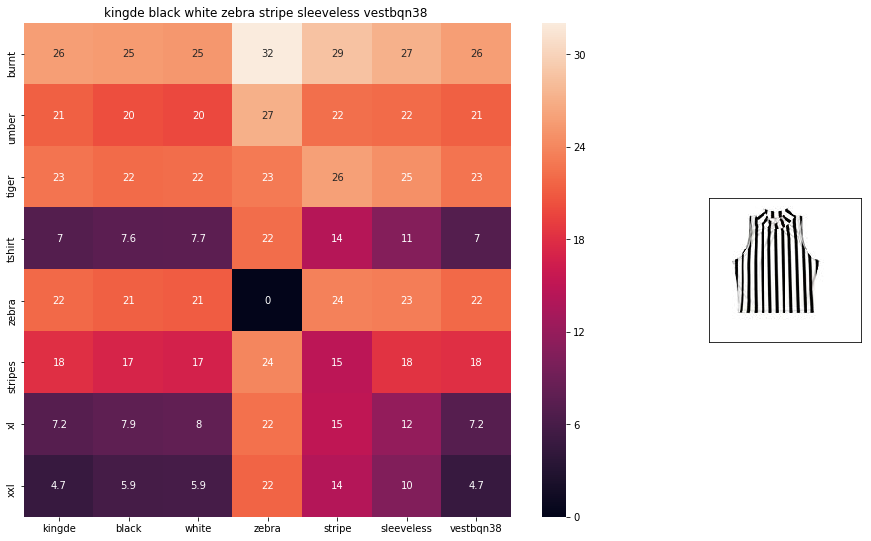

ASIN : B015H41F6G
Brand : KINGDE
euclidean distance from input : 6.13299


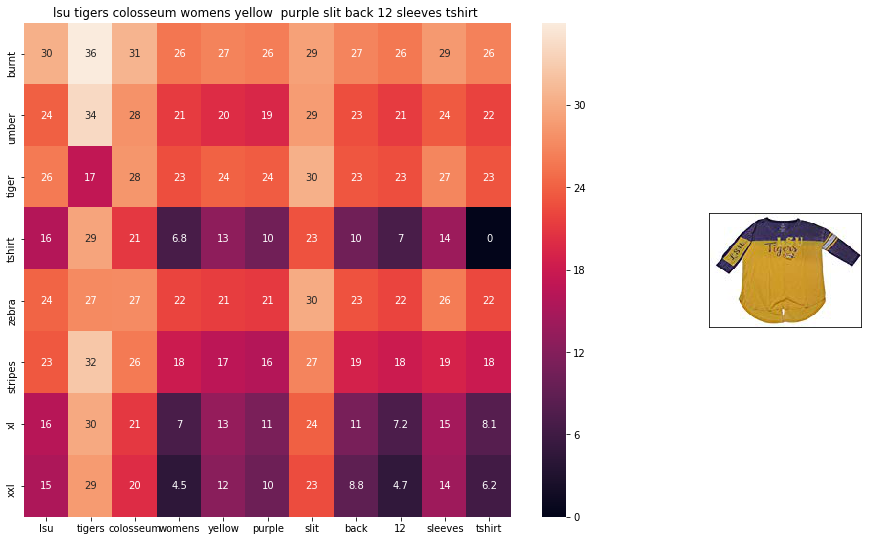

ASIN : B073R5Q8HD
Brand : Colosseum
euclidean distance from input : 6.2567067


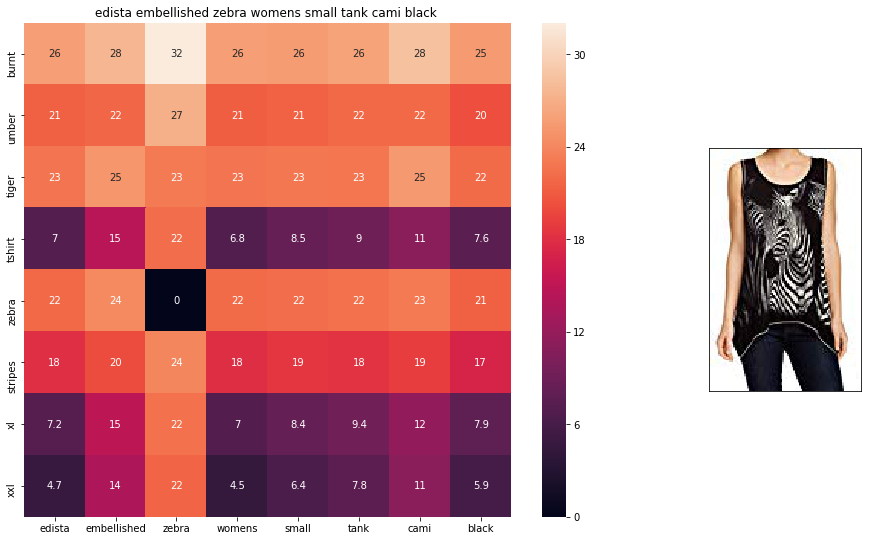

ASIN : B074P8MD22
Brand : Edista
euclidean distance from input : 6.3922043


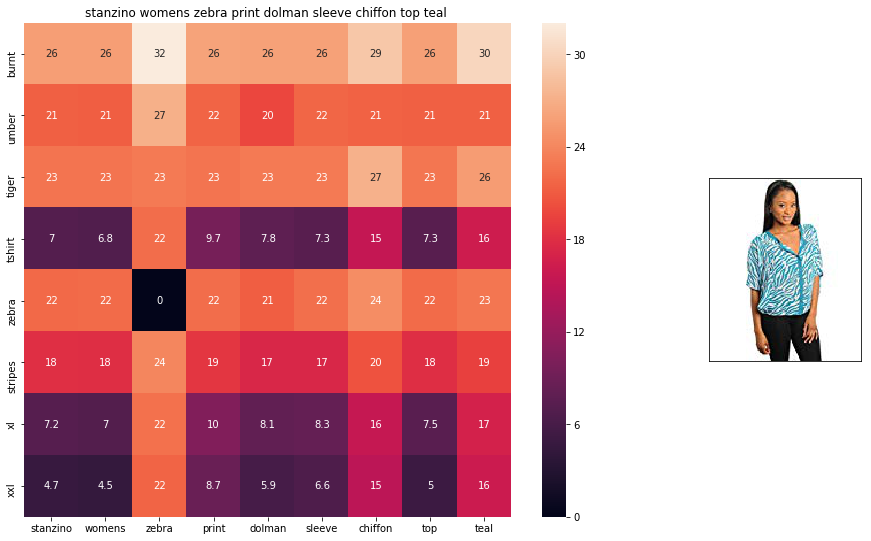

ASIN : B00C0I3U3E
Brand : Stanzino
euclidean distance from input : 6.414901


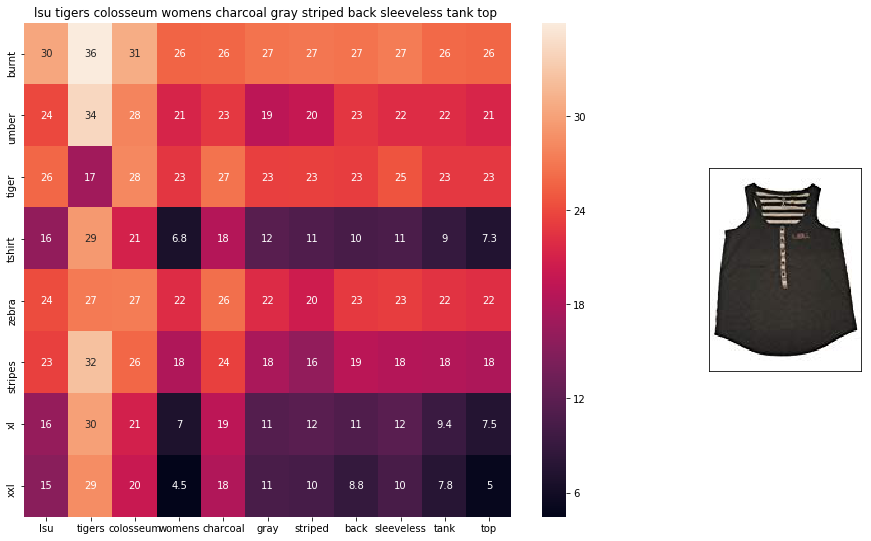

ASIN : B073R4ZM7Y
Brand : Colosseum
euclidean distance from input : 6.45096


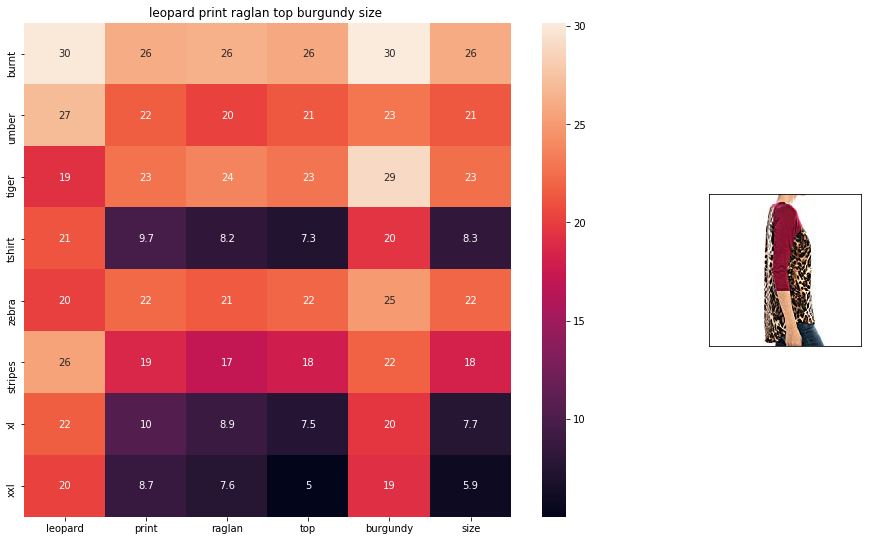

ASIN : B01C6ORLDQ
Brand : 1 Mad Fit
euclidean distance from input : 6.4634094


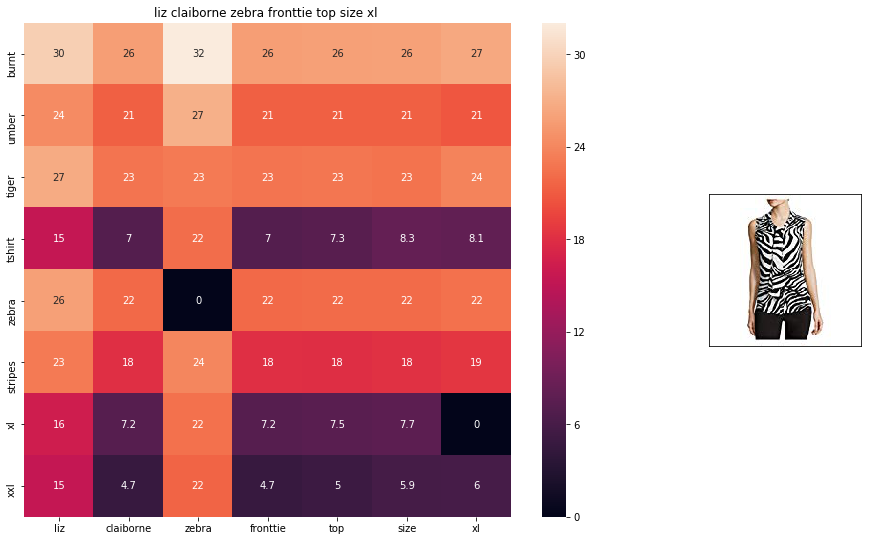

ASIN : B06XBY5QXL
Brand : Liz Claiborne
euclidean distance from input : 6.5392237


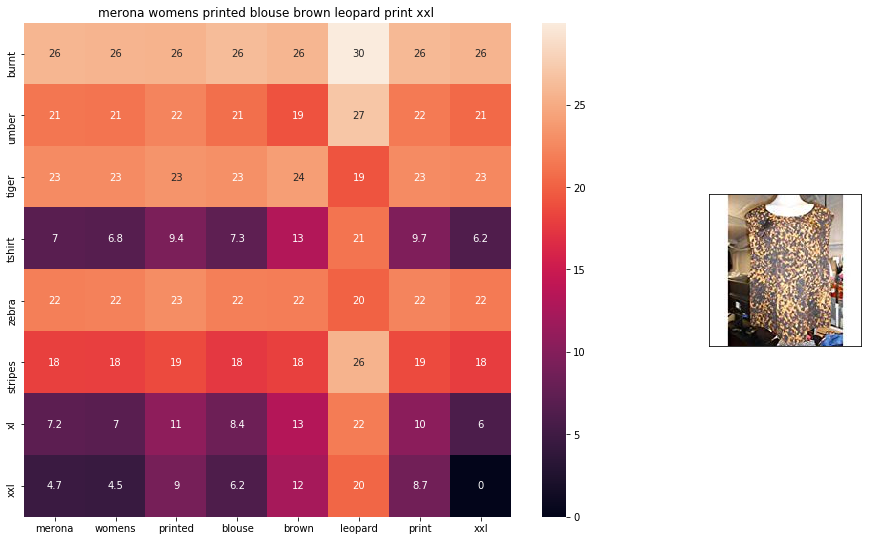

ASIN : B071YF3WDD
Brand : Merona
euclidean distance from input : 6.575504


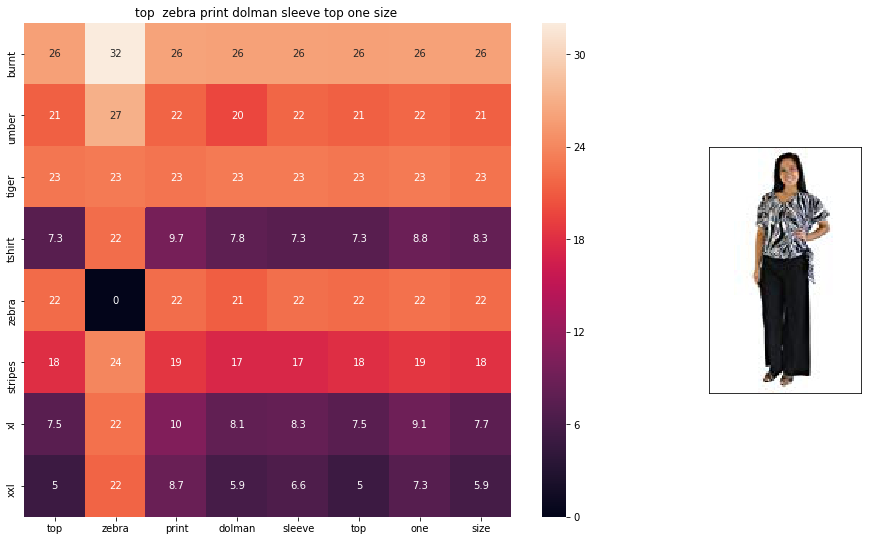

ASIN : B00H8A6ZLI
Brand : Vivian's Fashions
euclidean distance from input : 6.6382155


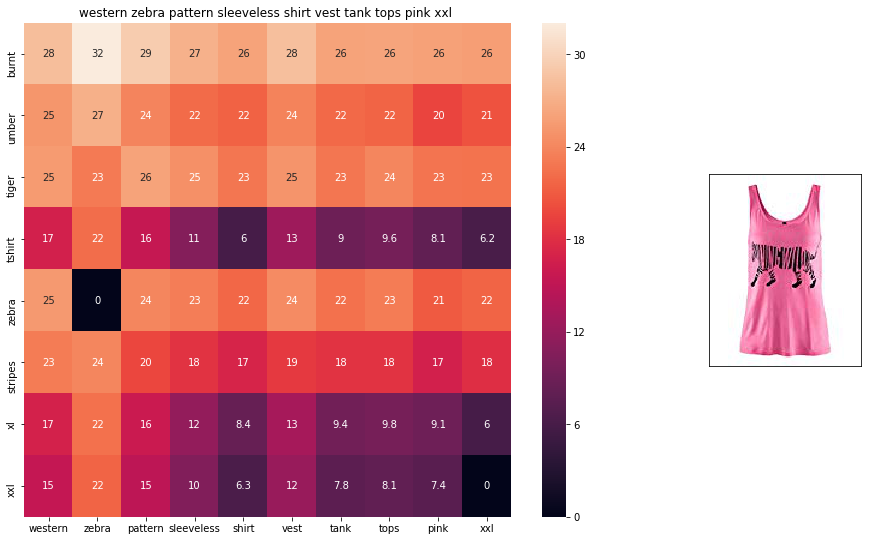

ASIN : B00Z6HEXWI
Brand : Black Temptation
euclidean distance from input : 6.660737


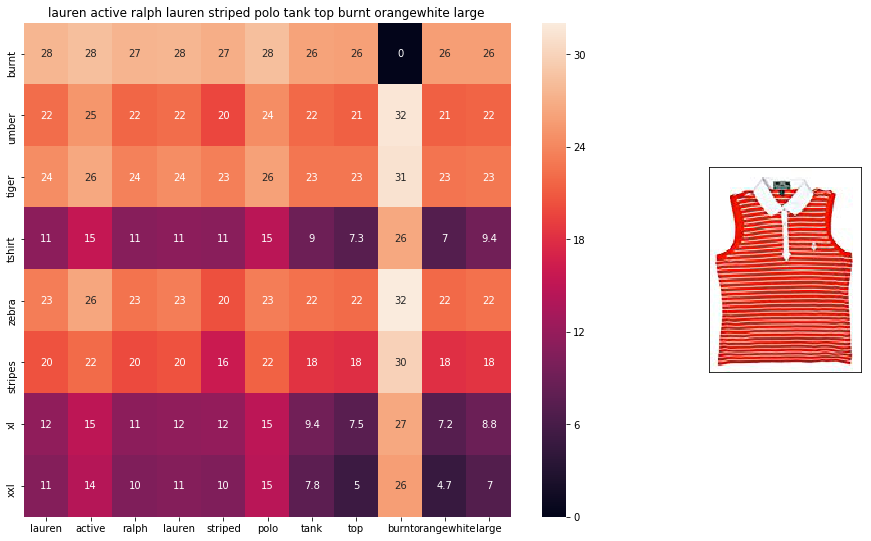

ASIN : B00ILGH5OY
Brand : Ralph Lauren Active
euclidean distance from input : 6.6839056


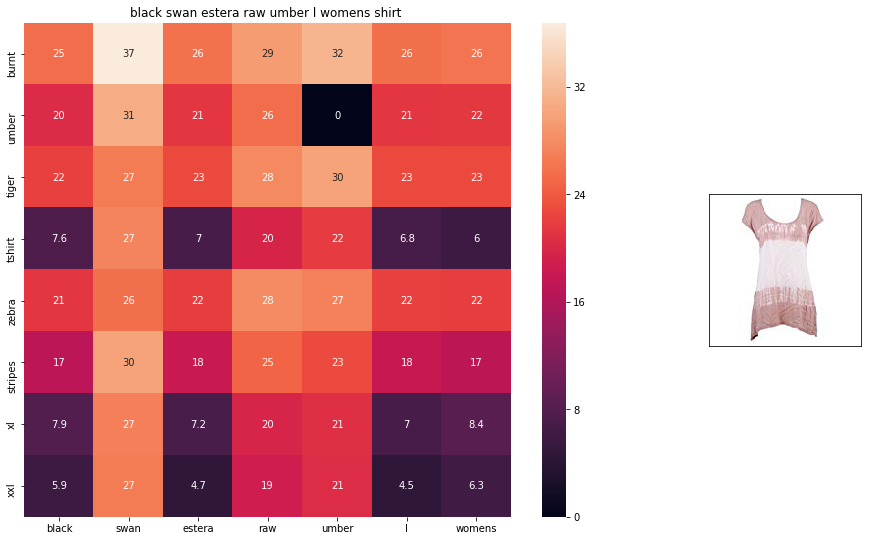

ASIN : B06Y1VN8WQ
Brand : Black Swan
euclidean distance from input : 6.7057643


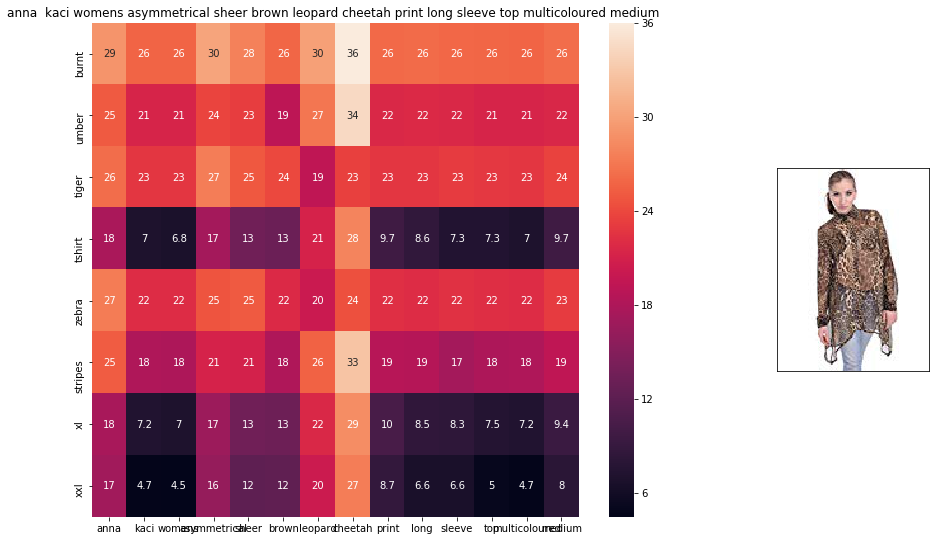

ASIN : B00KSNTY7Y
Brand : Anna-Kaci
euclidean distance from input : 6.706125


In [12]:
def weighted_w2v_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    
    for i in range(0, len(indices)):
        heat_map_w2v(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)

weighted_w2v_model(12566, 20)
#931
#12566
# in the give heat map, each cell contains the euclidean distance between words i, j

### [5] Weighted similarity using brand and color.

In [13]:
# some of the brand values are empty. 
# Need to replace Null with string "NULL"
data['brand'].fillna(value="Not given", inplace=True )
data['color'].fillna(value="Not given", inplace=True )

# replace spaces with hypen
brands = [x.replace(" ", "-") for x in data['brand'].values]
types = [x.replace(" ", "-") for x in data['product_type_name'].values]
colors = [x.replace(" ", "-") for x in data['color'].values]

brand_vectorizer = CountVectorizer()
brand_features = brand_vectorizer.fit_transform(brands)

type_vectorizer = CountVectorizer()
type_features = type_vectorizer.fit_transform(types)

color_vectorizer = CountVectorizer()
color_features = color_vectorizer.fit_transform(colors)

extra_features = hstack((brand_features, type_features, color_features)).tocsr()



In [14]:
def heat_map_w2v_brand(sentance1, sentance2, url, doc_id1, doc_id2, df_id1, df_id2, model):
    
    # sentance1 : title1, input apparel
    # sentance2 : title2, recommended apparel
    # url: apparel image url
    # doc_id1: document id of input apparel
    # doc_id2: document id of recommended apparel
    # df_id1: index of document1 in the data frame
    # df_id2: index of document2 in the data frame
    # model: it can have two values, 1. avg 2. weighted
    
    #s1_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s1_vec = get_word_vec(sentance1, doc_id1, model)
    #s2_vec = np.array(#number_of_words_title2 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s2_vec = get_word_vec(sentance2, doc_id2, model)
    
    # s1_s2_dist = np.array(#number of words in title1 * #number of words in title2)
    # s1_s2_dist[i,j] = euclidean distance between words i, j
    s1_s2_dist = get_distance(s1_vec, s2_vec)
   
    data_matrix = [['Asin','Brand', 'Color', 'Product type'],
               [data['asin'].loc[df_id1],brands[doc_id1], colors[doc_id1], types[doc_id1]], # input apparel's features
               [data['asin'].loc[df_id2],brands[doc_id2], colors[doc_id2], types[doc_id2]]] # recommonded apparel's features
    
    colorscale = [[0, '#1d004d'],[.5, '#f2e5ff'],[1, '#f2e5d1']] # to color the headings of each column 
    
    # we create a table with the data_matrix
    table = ff.create_table(data_matrix, index=True, colorscale=colorscale)
    # plot it with plotly
    plotly.offline.iplot(table, filename='simple_table')
    
    # devide whole figure space into 25 * 1:10 grids
    gs = gridspec.GridSpec(25, 15)
    fig = plt.figure(figsize=(25,5))
    
    # in first 25*10 grids we plot heatmap
    ax1 = plt.subplot(gs[:, :-5])
    # ploting the heap map based on the pairwise distances
    ax1 = sns.heatmap(np.round(s1_s2_dist,6), annot=True)
    # set the x axis labels as recommended apparels title
    ax1.set_xticklabels(sentance2.split())
    # set the y axis labels as input apparels title
    ax1.set_yticklabels(sentance1.split())
    # set title as recommended apparels title
    ax1.set_title(sentance2)

    # in last 25 * 10:15 grids we display image
    ax2 = plt.subplot(gs[:, 10:16])
    # we dont display grid lins and axis labels to images
    ax2.grid(False)
    ax2.set_xticks([])
    ax2.set_yticks([])
    
    # pass the url it display it
    display_img(url, ax2, fig)
    
    plt.show()

# [6] Keras and Tensorflow to extract features

In [15]:
import numpy as np
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Dropout, Flatten, Dense
from keras import applications
from sklearn.metrics import pairwise_distances
import matplotlib.pyplot as plt
import requests
from PIL import Image
import pandas as pd
import pickle

Using TensorFlow backend.


In [16]:

# credits: https://www.kaggle.com/c/word2vec-nlp-tutorial#part-2-word-vectors
# Custom Word2Vec using your own text data.
# Do NOT RUN this code.
# It is meant as a reference to build your own Word2Vec when you have 
# lots of data.

'''
# Set values for various parameters
num_features = 300    # Word vector dimensionality                      
min_word_count = 1    # Minimum word count                        
num_workers = 4       # Number of threads to run in parallel
context = 10          # Context window size                                                                                    
downsampling = 1e-3   # Downsample setting for frequent words

# Initialize and train the model (this will take some time)
from gensim.models import word2vec
print ("Training model...")
model = word2vec.Word2Vec(sen_corpus, workers=num_workers, \
            size=num_features, min_count = min_word_count, \
            window = context)
    
'''

'\n# Set values for various parameters\nnum_features = 300    # Word vector dimensionality                      \nmin_word_count = 1    # Minimum word count                        \nnum_workers = 4       # Number of threads to run in parallel\ncontext = 10          # Context window size                                                                                    \ndownsampling = 1e-3   # Downsample setting for frequent words\n\n# Initialize and train the model (this will take some time)\nfrom gensim.models import word2vec\nprint ("Training model...")\nmodel = word2vec.Word2Vec(sen_corpus, workers=num_workers,             size=num_features, min_count = min_word_count,             window = context)\n    \n'

# [7] Visual features based product similarity.

In [17]:
#load the features and corresponding ASINS info.
bottleneck_features_train = np.load('16k_data_cnn_features.npy')
asins = np.load('16k_data_cnn_feature_asins.npy')
asins = list(asins)

# load the original 16K dataset
data = pd.read_pickle('pickels/16k_apperal_data_preprocessed')
df_asins = list(data['asin'])

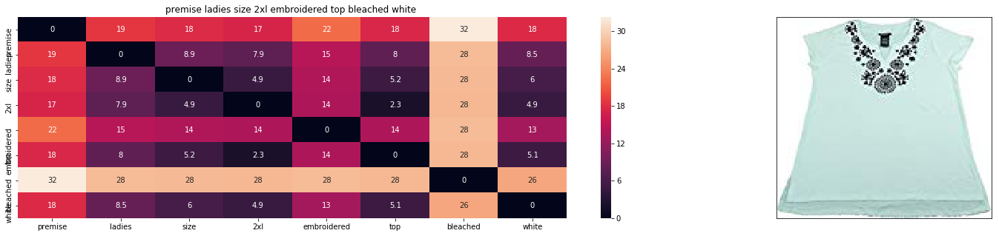

ASIN : B01M0IDUCV
TITLE :  premise ladies size 2xl embroidered top bleached white 
BRAND :  Premise
COLOR :  Bleached White
euclidean distance from input : 2.0286129625308496


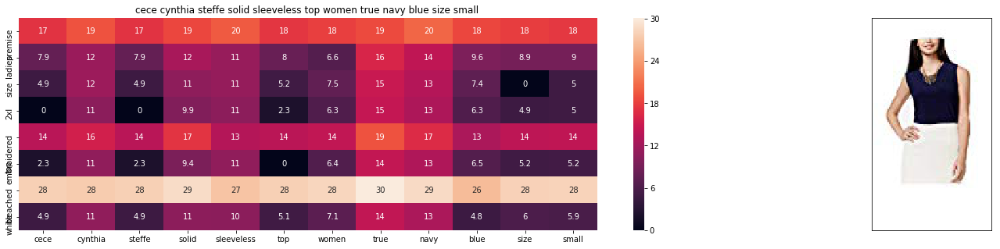

ASIN : B01N4NQ7LX
TITLE :  cece cynthia steffe solid sleeveless top women true navy blue size small 
BRAND :  CeCe by Cynthia Steffe
COLOR :  True Navy
euclidean distance from input : 10.366580372238019


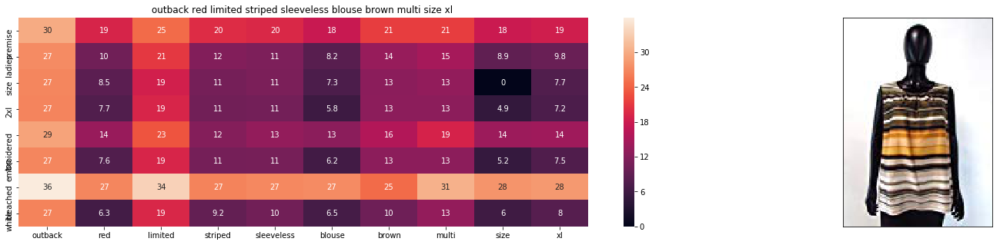

ASIN : B01IU645VU
TITLE :  outback red limited striped sleeveless blouse brown multi size xl 
BRAND :  Outback Red
COLOR :  Brown Stripe
euclidean distance from input : 13.139243481276816


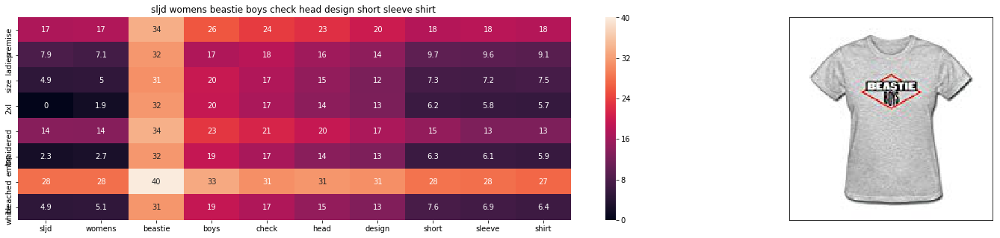

ASIN : B01FQLKKMK
TITLE :  sljd womens beastie boys check head design short sleeve shirt 
BRAND :  SLJD
COLOR :  Grey
euclidean distance from input : 14.08260507298376


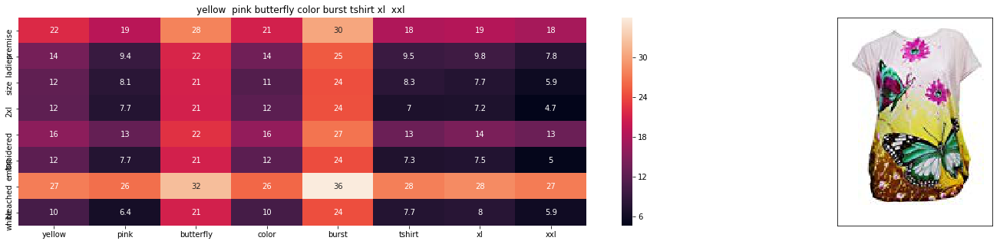

ASIN : B00JXQBBMI
TITLE :  yellow  pink butterfly color burst tshirt xl  xxl 
BRAND :  Si Row
COLOR :  Yellow
euclidean distance from input : 14.912482617054433


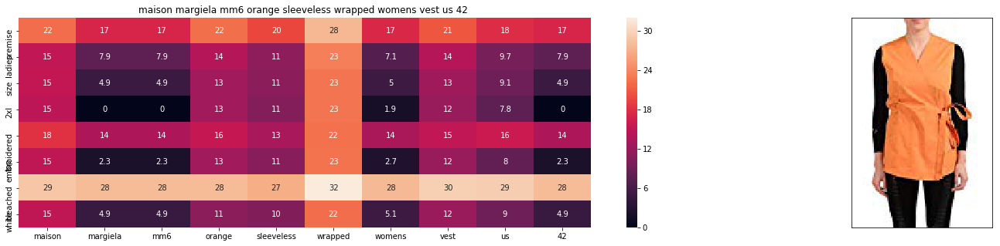

ASIN : B01MXI5L4G
TITLE :  maison margiela mm6 orange sleeveless wrapped womens vest us 42 
BRAND :  Maison Margiela MM6
COLOR :  Orange
euclidean distance from input : 15.002935298982273


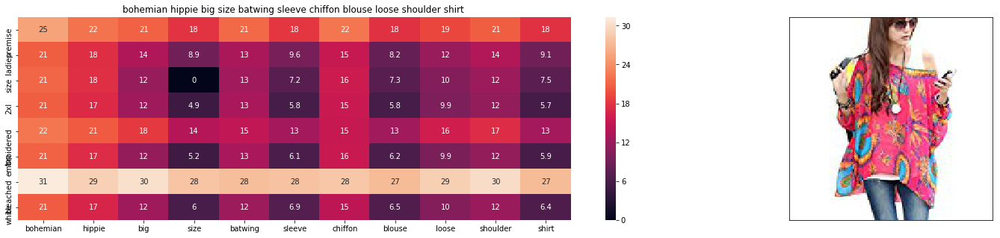

ASIN : B00YC92VRU
TITLE :  bohemian hippie big size batwing sleeve chiffon blouse loose shoulder shirt 
BRAND :  Display Promotion
COLOR :  R
euclidean distance from input : 15.067370321307262


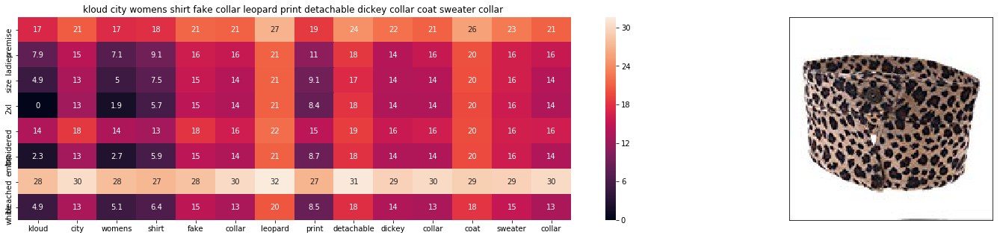

ASIN : B01NBM80SP
TITLE :  kloud city womens shirt fake collar leopard print detachable dickey collar coat sweater collar 
BRAND :  KLOUD City
COLOR :  Brown
euclidean distance from input : 15.104652030866086


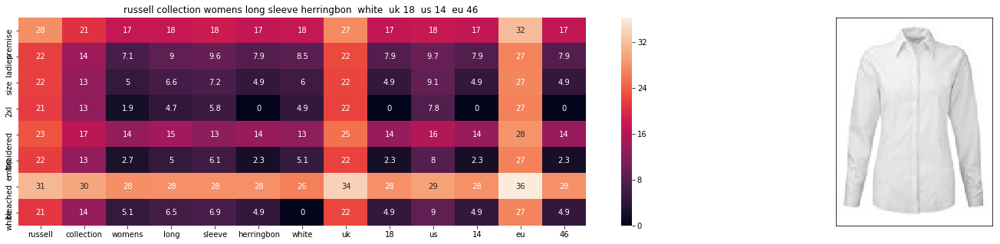

ASIN : B00K77AN5S
TITLE :  russell collection womens long sleeve herringbon  white  uk 18  us 14  eu 46 
BRAND :  Russell Collection
COLOR :  White
euclidean distance from input : 15.113720837938521


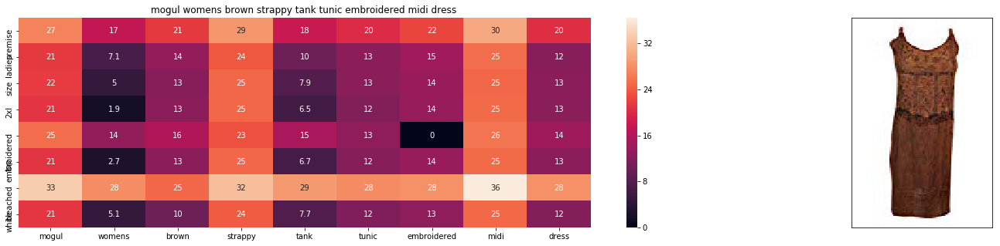

ASIN : B07191F766
TITLE :  mogul womens brown strappy tank tunic embroidered midi dress 
BRAND :  Mogul Interior
COLOR :  Brown
euclidean distance from input : 15.122973797438926


In [18]:
def get_similar_products_cnn(doc_id, w1, w2, w3,w4,w5, num_results):
    # doc_id: apparel's id in given corpus
    # w1: weight for  w2v features
    # w2: weight for brand and color features
    # w3: weight for image

    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    brand_features_dist = pairwise_distances(brand_features, brand_features[doc_id].reshape(1,-1))
    type_features_dist = pairwise_distances(type_features, type_features[doc_id].reshape(1,-1))
    color_features_dist = pairwise_distances(color_features, color_features[doc_id].reshape(1,-1))
    #ex_feat_dist = pairwise_distances(extra_features, extra_features[doc_id]) #it consists of brand and color
    doc_id = asins.index(df_asins[doc_id])
    img_dist = pairwise_distances(bottleneck_features_train, bottleneck_features_train[doc_id].reshape(1,-1))
    pairwise_dist   = (w1 * idf_w2v_dist +  w2 * brand_features_dist + w3 * type_features_dist+w4*color_features_dist+w5*img_dist)/float(w1 + w2 + w3+w4+w5)

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    

    for i in range(0, len(indices)):
        heat_map_w2v_brand(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])     
        print('TITLE : ',data['title'].loc[df_indices[i]])        
        print('BRAND : ',data['brand'].loc[df_indices[i]])        
        print('COLOR : ',data['color'].loc[df_indices[i]]) 
        print('euclidean distance from input :', pdists[i])
        print('='*125)

get_similar_products_cnn(12566, 7, 5, 10,15,14, 10)
# in the give heat map, each cell contains the euclidean distance between words i, j

## Giving More weight to W1 and some less weight to other features

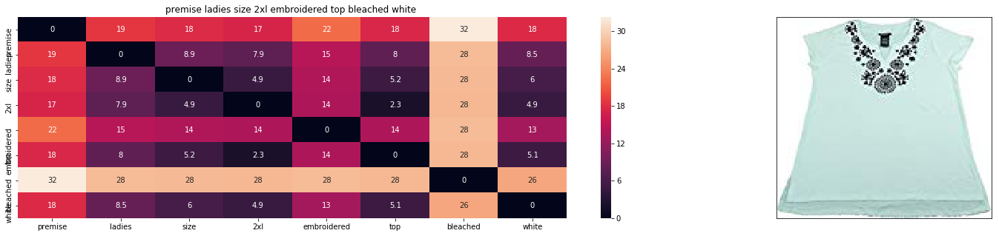

ASIN : B01M0IDUCV
TITLE :  premise ladies size 2xl embroidered top bleached white 
BRAND :  Premise
COLOR :  Bleached White
euclidean distance from input : 3.101649438783535


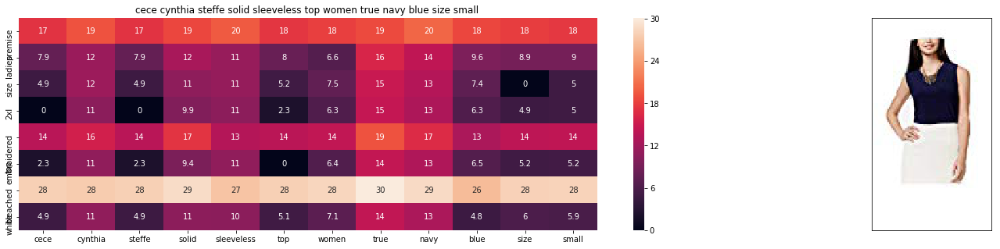

ASIN : B01N4NQ7LX
TITLE :  cece cynthia steffe solid sleeveless top women true navy blue size small 
BRAND :  CeCe by Cynthia Steffe
COLOR :  True Navy
euclidean distance from input : 9.249043356719028


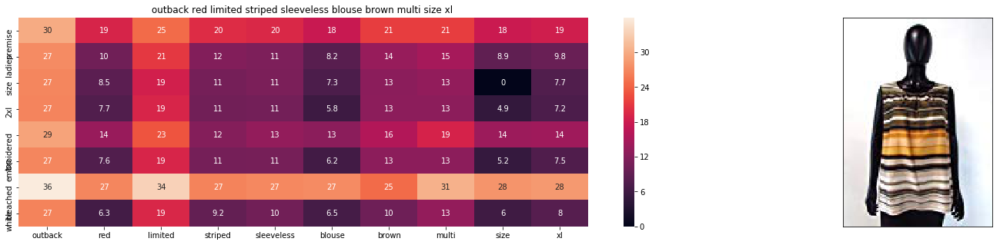

ASIN : B01IU645VU
TITLE :  outback red limited striped sleeveless blouse brown multi size xl 
BRAND :  Outback Red
COLOR :  Brown Stripe
euclidean distance from input : 11.244376434420131


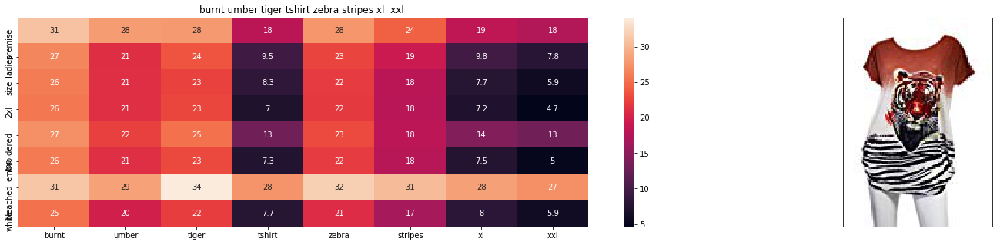

ASIN : B00JXQB5FQ
TITLE :  burnt umber tiger tshirt zebra stripes xl  xxl 
BRAND :  Si Row
COLOR :  Brown
euclidean distance from input : 11.813619384765625


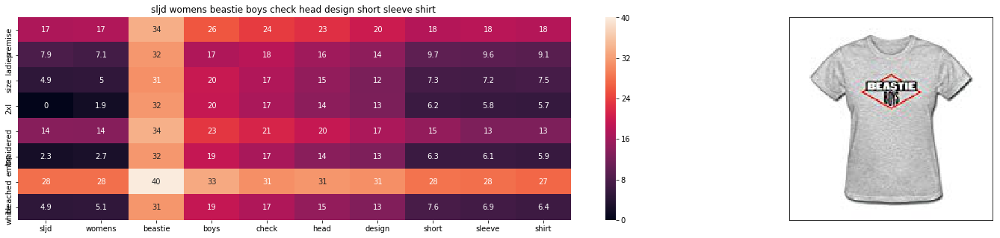

ASIN : B01FQLKKMK
TITLE :  sljd womens beastie boys check head design short sleeve shirt 
BRAND :  SLJD
COLOR :  Grey
euclidean distance from input : 12.032983828460033


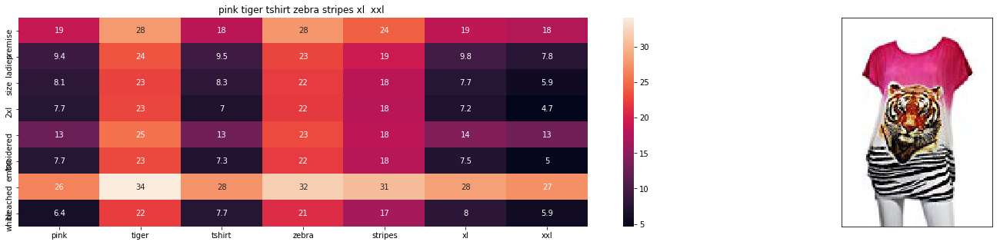

ASIN : B00JXQASS6
TITLE :  pink tiger tshirt zebra stripes xl  xxl 
BRAND :  Si Row
COLOR :  Pink
euclidean distance from input : 12.232050262501764


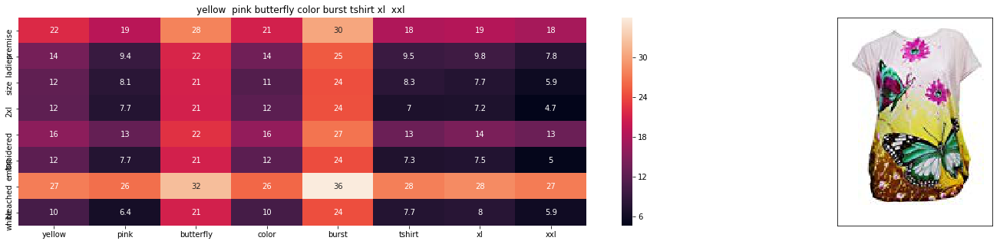

ASIN : B00JXQBBMI
TITLE :  yellow  pink butterfly color burst tshirt xl  xxl 
BRAND :  Si Row
COLOR :  Yellow
euclidean distance from input : 12.236074310353326


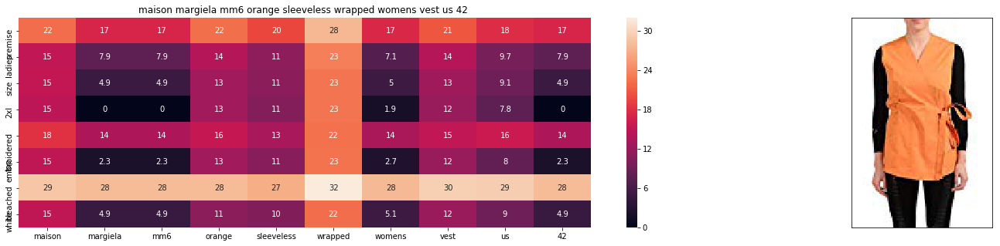

ASIN : B01MXI5L4G
TITLE :  maison margiela mm6 orange sleeveless wrapped womens vest us 42 
BRAND :  Maison Margiela MM6
COLOR :  Orange
euclidean distance from input : 12.634031144818357


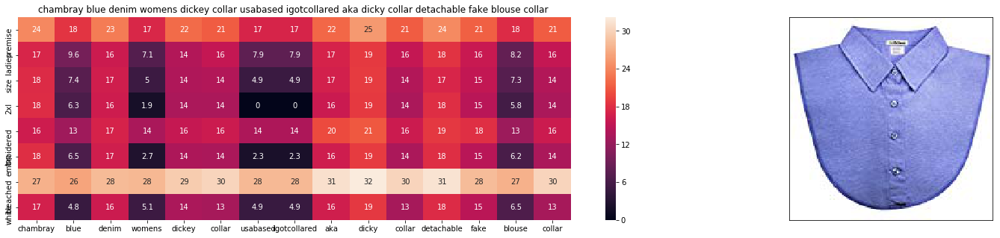

ASIN : B01MQWKWME
TITLE :  chambray blue denim womens dickey collar usabased igotcollared aka dicky collar detachable fake blouse collar 
BRAND :  IGotCollared
COLOR :  Chambray Blue Denim
euclidean distance from input : 12.639743685587172


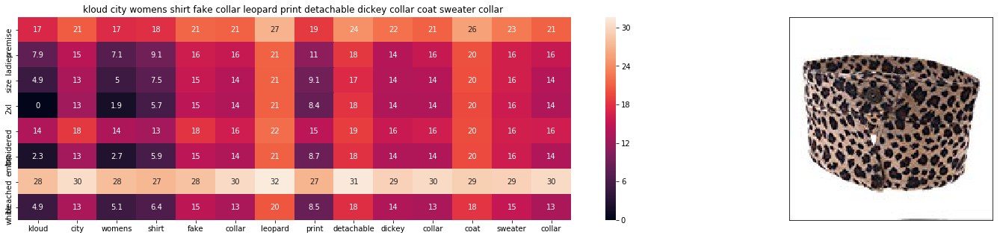

ASIN : B01NBM80SP
TITLE :  kloud city womens shirt fake collar leopard print detachable dickey collar coat sweater collar 
BRAND :  KLOUD City
COLOR :  Brown
euclidean distance from input : 12.709603790377162


In [21]:
get_similar_products_cnn(12566, 15, 5,13,7, 10, 10)



## Giving More weight to W2 and some less weight to other features

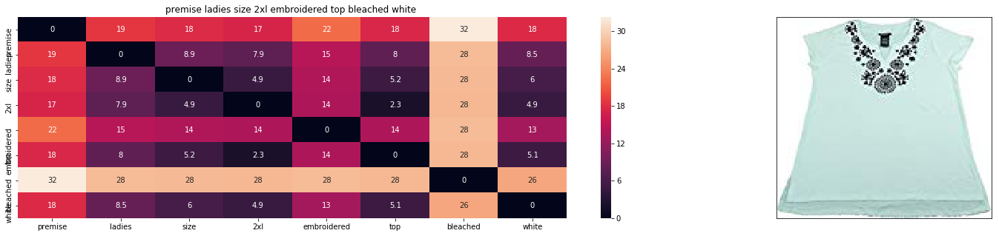

ASIN : B01M0IDUCV
TITLE :  premise ladies size 2xl embroidered top bleached white 
BRAND :  Premise
COLOR :  Bleached White
euclidean distance from input : 1.9999209414165013


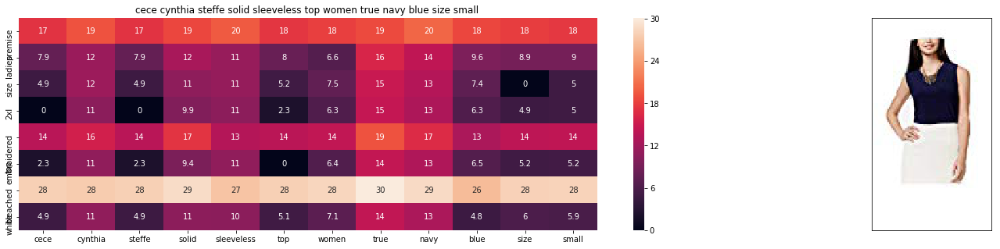

ASIN : B01N4NQ7LX
TITLE :  cece cynthia steffe solid sleeveless top women true navy blue size small 
BRAND :  CeCe by Cynthia Steffe
COLOR :  True Navy
euclidean distance from input : 9.657846196606583


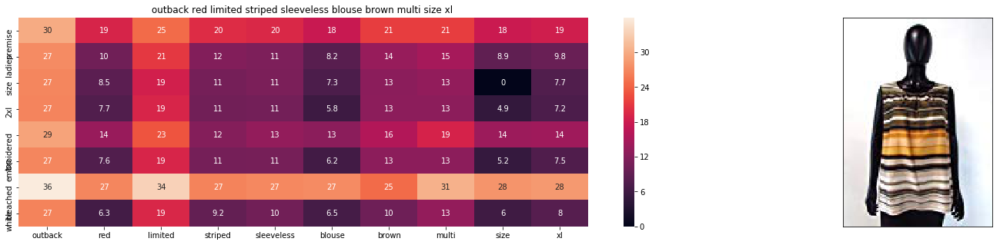

ASIN : B01IU645VU
TITLE :  outback red limited striped sleeveless blouse brown multi size xl 
BRAND :  Outback Red
COLOR :  Brown Stripe
euclidean distance from input : 12.137893695658283


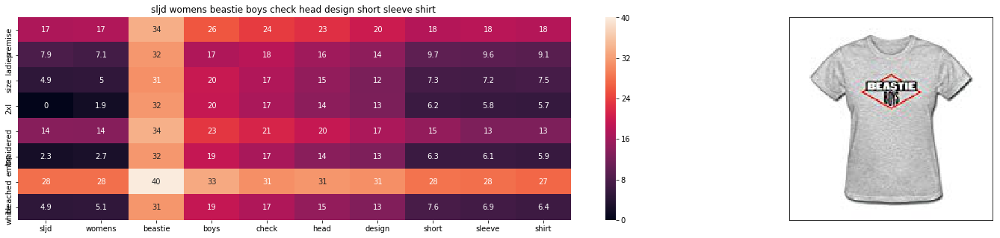

ASIN : B01FQLKKMK
TITLE :  sljd womens beastie boys check head design short sleeve shirt 
BRAND :  SLJD
COLOR :  Grey
euclidean distance from input : 12.879132766485636


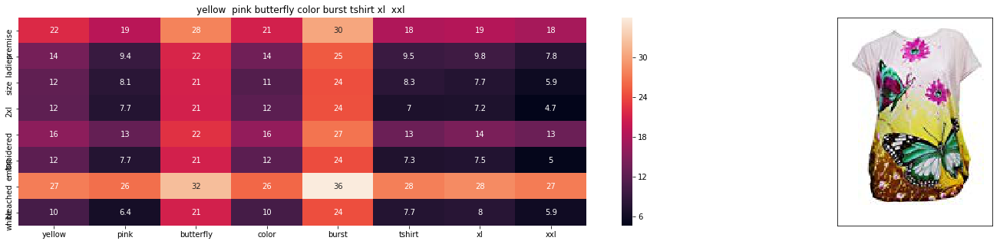

ASIN : B00JXQBBMI
TITLE :  yellow  pink butterfly color burst tshirt xl  xxl 
BRAND :  Si Row
COLOR :  Yellow
euclidean distance from input : 13.2487267012013


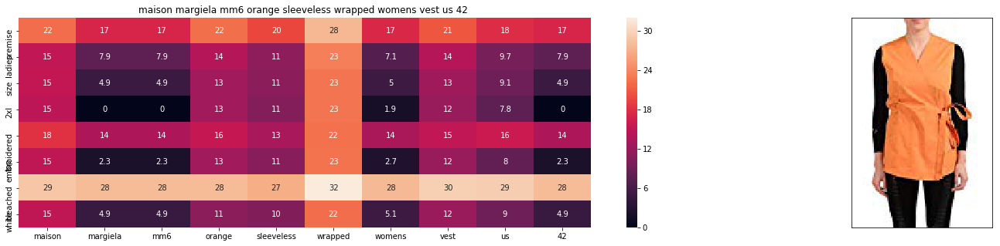

ASIN : B01MXI5L4G
TITLE :  maison margiela mm6 orange sleeveless wrapped womens vest us 42 
BRAND :  Maison Margiela MM6
COLOR :  Orange
euclidean distance from input : 13.818057811398244


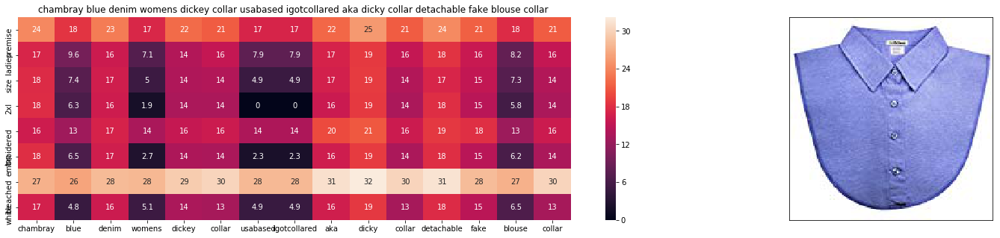

ASIN : B01MQWKWME
TITLE :  chambray blue denim womens dickey collar usabased igotcollared aka dicky collar detachable fake blouse collar 
BRAND :  IGotCollared
COLOR :  Chambray Blue Denim
euclidean distance from input : 13.859836275727526


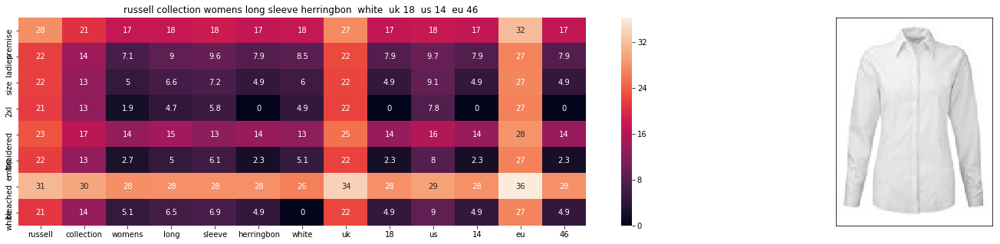

ASIN : B00K77AN5S
TITLE :  russell collection womens long sleeve herringbon  white  uk 18  us 14  eu 46 
BRAND :  Russell Collection
COLOR :  White
euclidean distance from input : 13.865663580362911


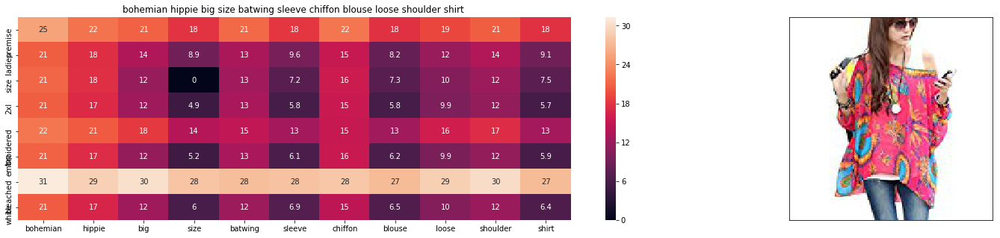

ASIN : B00YC92VRU
TITLE :  bohemian hippie big size batwing sleeve chiffon blouse loose shoulder shirt 
BRAND :  Display Promotion
COLOR :  R
euclidean distance from input : 13.872187032879781


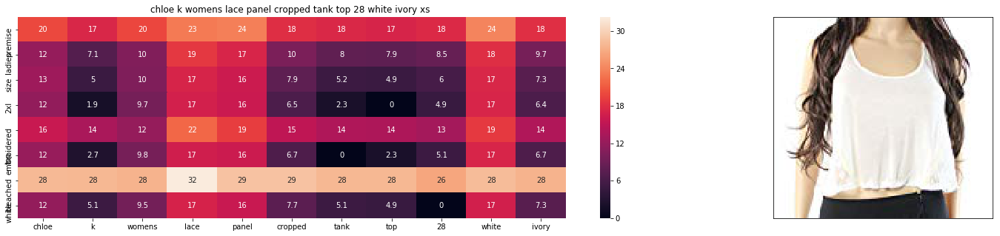

ASIN : B071VZCT5W
TITLE :  chloe k womens lace panel cropped tank top 28 white ivory xs 
BRAND :  Chloe K.
COLOR :  White Ivory
euclidean distance from input : 13.912737966306787


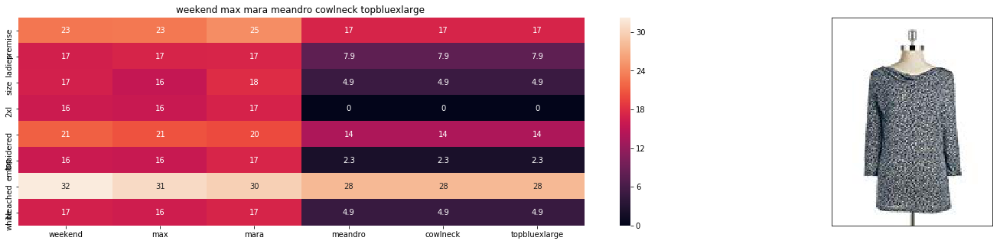

ASIN : B01MG83UB4
TITLE :  weekend max mara meandro cowlneck topbluexlarge 
BRAND :  MaxMara
COLOR :  Blue
euclidean distance from input : 13.916712149864782


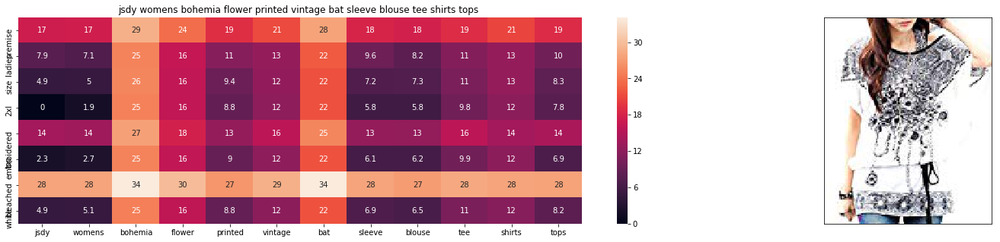

ASIN : B00L8RE3PC
TITLE :  jsdy womens bohemia flower printed vintage bat sleeve blouse tee shirts tops 
BRAND :  JSDY-Cloth
COLOR :  White
euclidean distance from input : 13.942921937658195


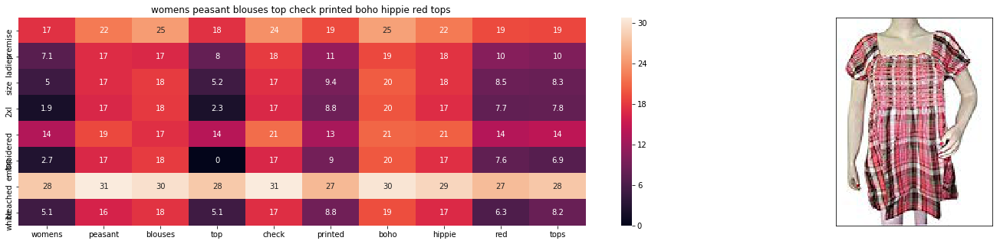

ASIN : B01MXMG6KB
TITLE :  womens peasant blouses top check printed boho hippie red tops 
BRAND :  Mogul Interior
COLOR :  Red
euclidean distance from input : 13.959582557323271


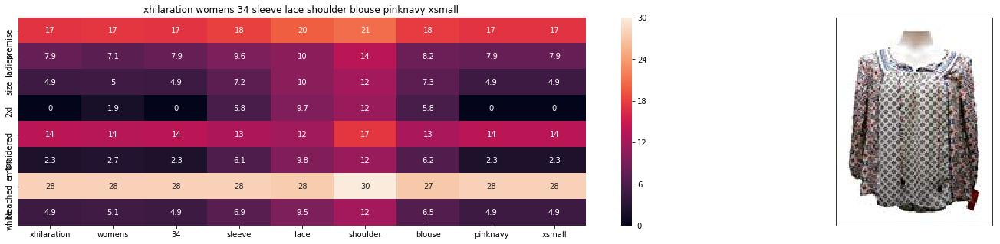

ASIN : B06ZYLKPRT
TITLE :  xhilaration womens 34 sleeve lace shoulder blouse pinknavy xsmall 
BRAND :  Xhilaration
COLOR :  , Pink/Navy,
euclidean distance from input : 13.988578292309874


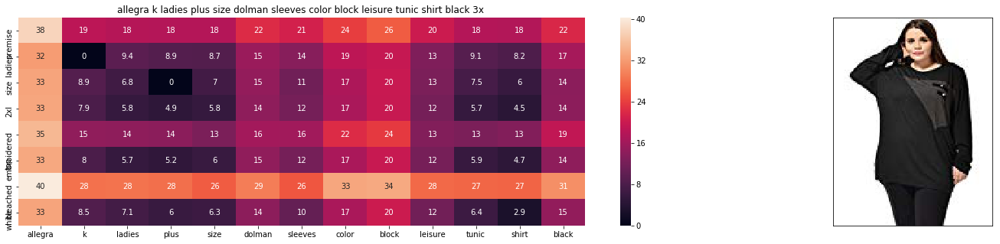

ASIN : B00D2J5HPO
TITLE :  allegra k ladies plus size dolman sleeves color block leisure tunic shirt black 3x 
BRAND :  Kaia
COLOR :  Black
euclidean distance from input : 13.99210620338282


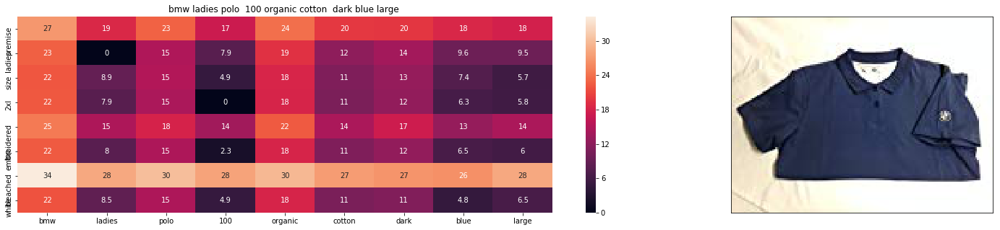

ASIN : B0060MKVX8
TITLE :  bmw ladies polo  100 organic cotton  dark blue large 
BRAND :  None
COLOR :  Blue
euclidean distance from input : 13.993729466683803


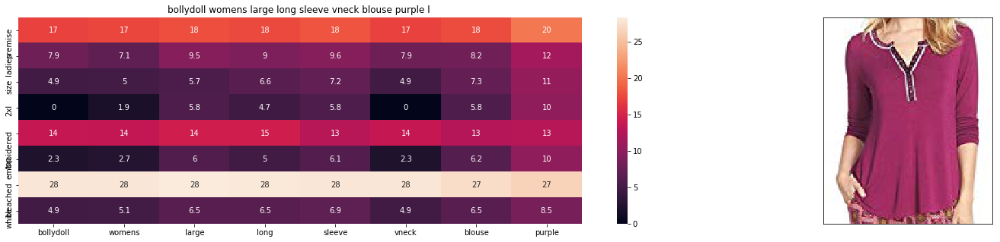

ASIN : B074MJPLCB
TITLE :  bollydoll womens large long sleeve vneck blouse purple l 
BRAND :  BollyDoll
COLOR :  Purple
euclidean distance from input : 13.998961544034344


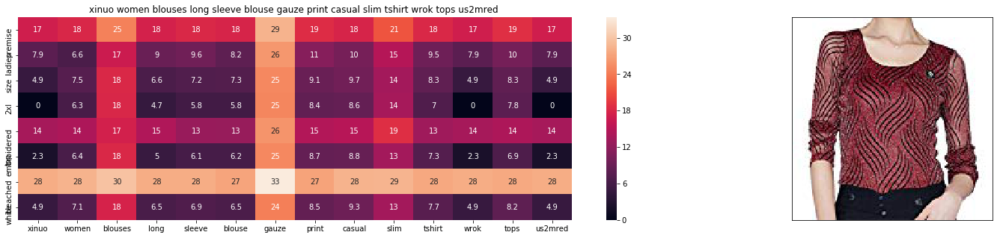

ASIN : B01MU874KK
TITLE :  xinuo women blouses long sleeve blouse gauze print casual slim tshirt wrok tops us2mred 
BRAND :  XINUO
COLOR :  Red
euclidean distance from input : 14.002005389882145


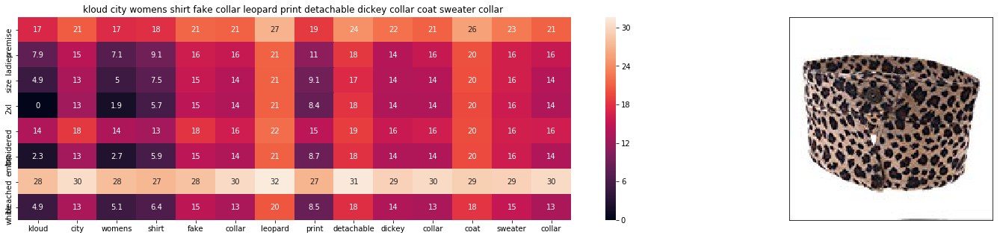

ASIN : B01NBM80SP
TITLE :  kloud city womens shirt fake collar leopard print detachable dickey collar coat sweater collar 
BRAND :  KLOUD City
COLOR :  Brown
euclidean distance from input : 14.022123002479752


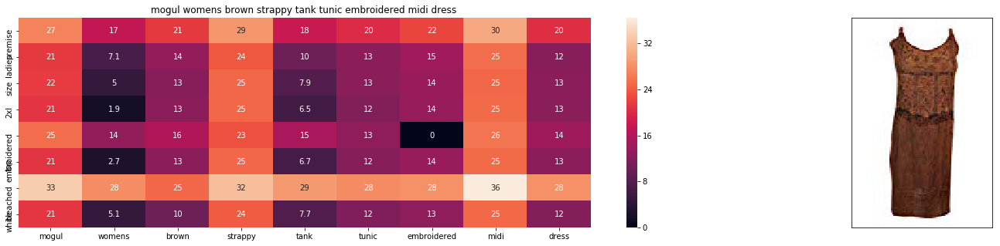

ASIN : B07191F766
TITLE :  mogul womens brown strappy tank tunic embroidered midi dress 
BRAND :  Mogul Interior
COLOR :  Brown
euclidean distance from input : 14.03860419008826


In [22]:
get_similar_products_cnn(12566,10,25,14,12,20, 20)

## Giving More weight to W3 and some less weight to other features

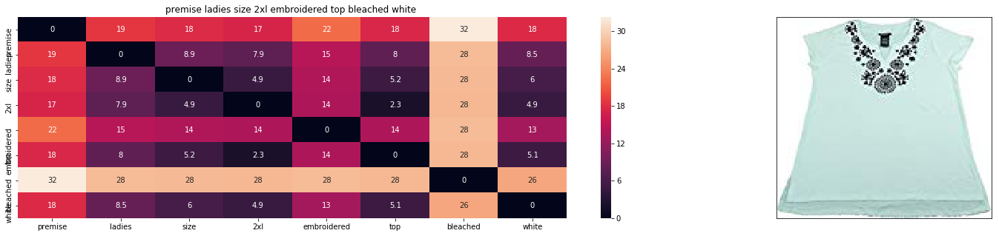

ASIN : B01M0IDUCV
TITLE :  premise ladies size 2xl embroidered top bleached white 
BRAND :  Premise
COLOR :  Bleached White
euclidean distance from input : 2.933442163919417


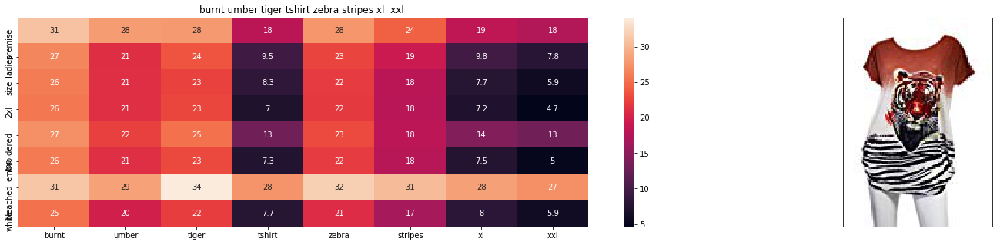

ASIN : B00JXQB5FQ
TITLE :  burnt umber tiger tshirt zebra stripes xl  xxl 
BRAND :  Si Row
COLOR :  Brown
euclidean distance from input : 3.58041728626598


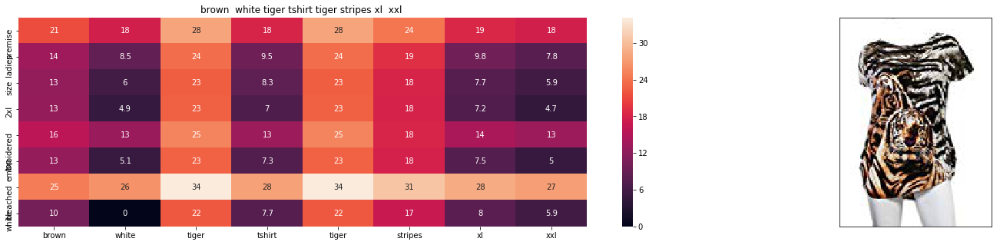

ASIN : B00JXQCWTO
TITLE :  brown  white tiger tshirt tiger stripes xl  xxl 
BRAND :  Si Row
COLOR :  Brown
euclidean distance from input : 4.668289878151634


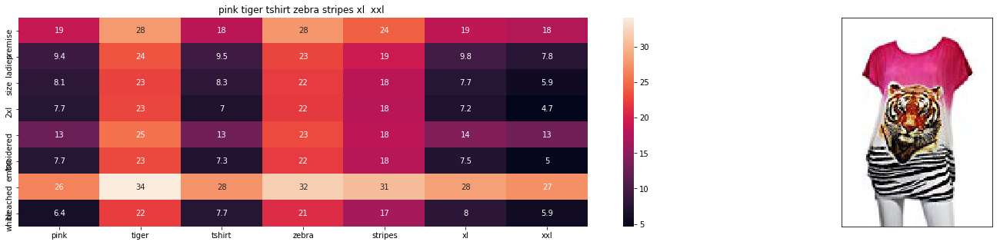

ASIN : B00JXQASS6
TITLE :  pink tiger tshirt zebra stripes xl  xxl 
BRAND :  Si Row
COLOR :  Pink
euclidean distance from input : 4.682969700329607


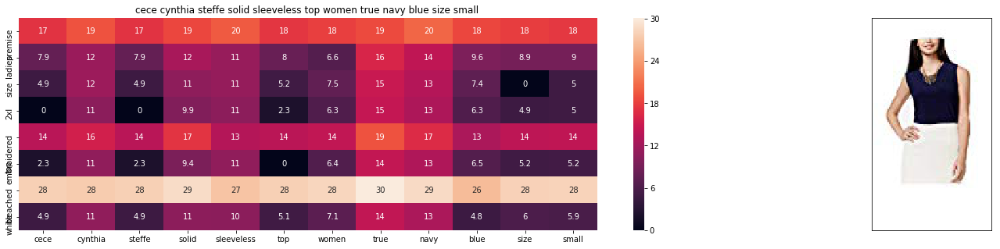

ASIN : B01N4NQ7LX
TITLE :  cece cynthia steffe solid sleeveless top women true navy blue size small 
BRAND :  CeCe by Cynthia Steffe
COLOR :  True Navy
euclidean distance from input : 4.962248235996125


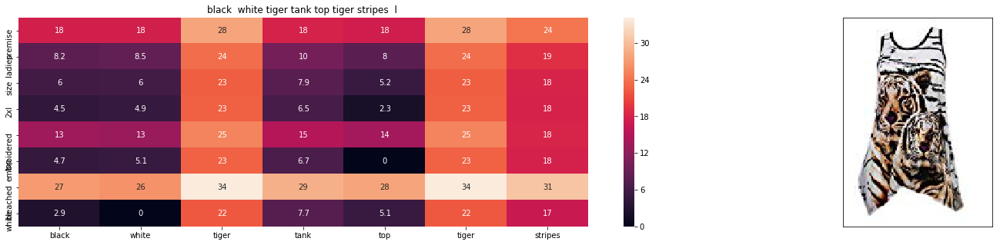

ASIN : B00JXQAO94
TITLE :  black  white tiger tank top tiger stripes  l 
BRAND :  Si Row
COLOR :  White
euclidean distance from input : 5.124466231498227


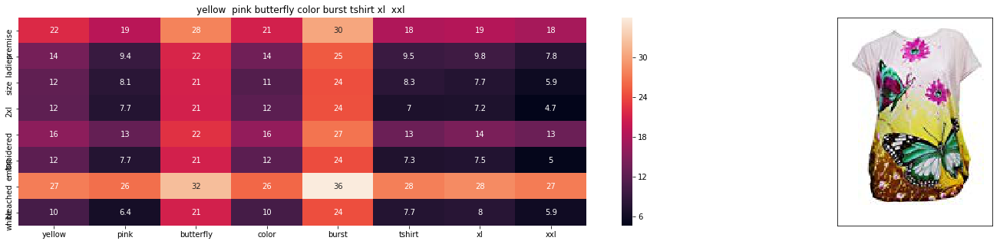

ASIN : B00JXQBBMI
TITLE :  yellow  pink butterfly color burst tshirt xl  xxl 
BRAND :  Si Row
COLOR :  Yellow
euclidean distance from input : 5.1366054073756535


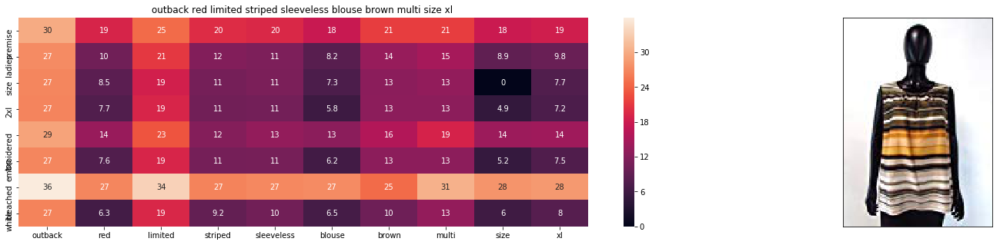

ASIN : B01IU645VU
TITLE :  outback red limited striped sleeveless blouse brown multi size xl 
BRAND :  Outback Red
COLOR :  Brown Stripe
euclidean distance from input : 5.221466977726023


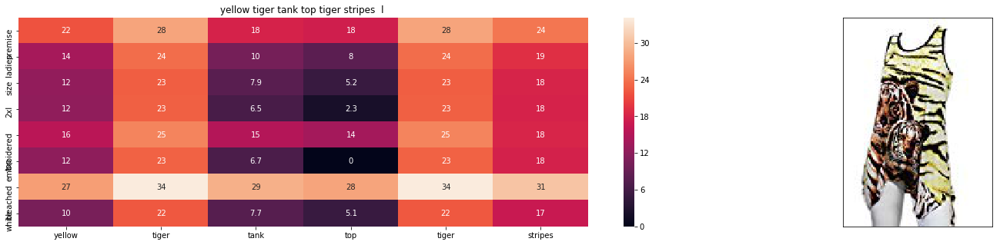

ASIN : B00JXQAUWA
TITLE :  yellow tiger tank top tiger stripes  l 
BRAND :  Si Row
COLOR :  Yellow
euclidean distance from input : 5.296371980270125


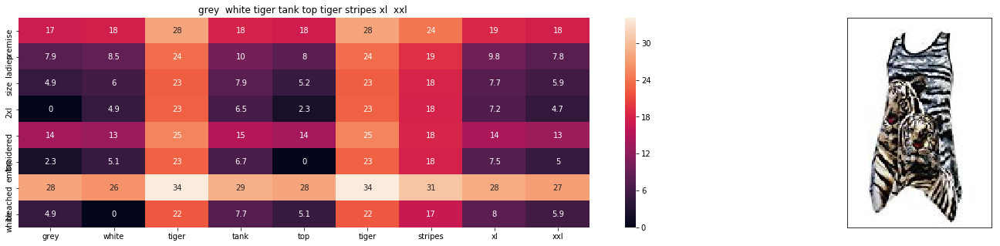

ASIN : B00JXQAFZ2
TITLE :  grey  white tiger tank top tiger stripes xl  xxl 
BRAND :  Si Row
COLOR :  Grey
euclidean distance from input : 5.299118562301375


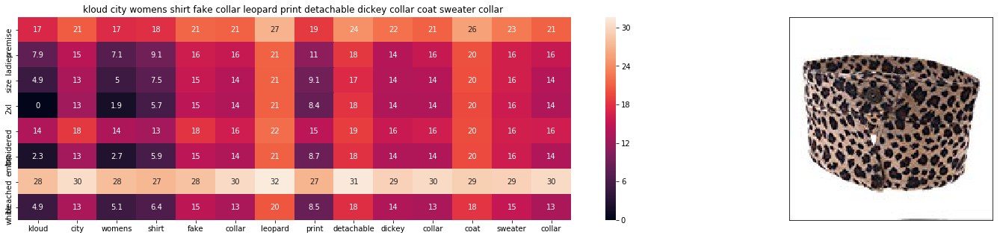

ASIN : B01NBM80SP
TITLE :  kloud city womens shirt fake collar leopard print detachable dickey collar coat sweater collar 
BRAND :  KLOUD City
COLOR :  Brown
euclidean distance from input : 5.339037103421454


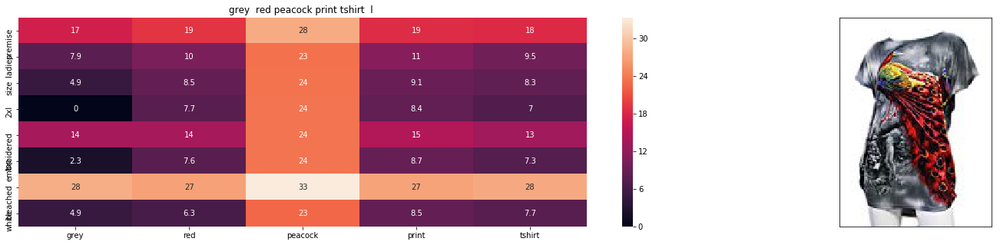

ASIN : B00JXQCFRS
TITLE :  grey  red peacock print tshirt  l 
BRAND :  Si Row
COLOR :  Grey
euclidean distance from input : 5.395115650184602


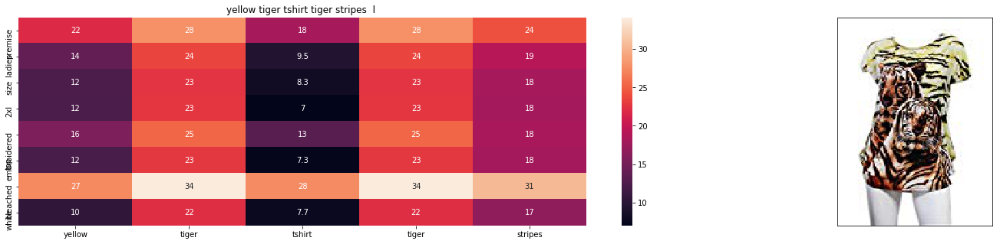

ASIN : B00JXQCUIC
TITLE :  yellow tiger tshirt tiger stripes  l 
BRAND :  Si Row
COLOR :  Yellow
euclidean distance from input : 5.396680600838603


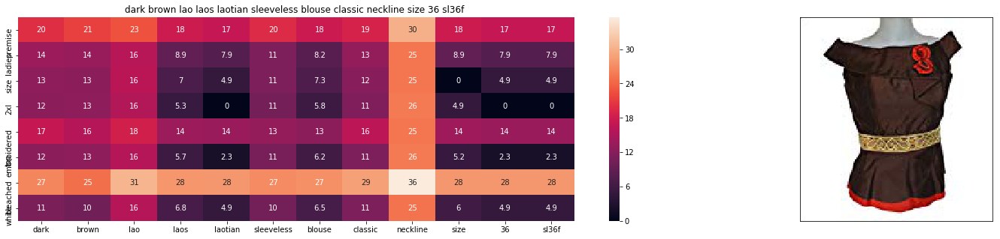

ASIN : B074J7BCYM
TITLE :  dark brown lao laos laotian sleeveless blouse classic neckline size 36 sl36f 
BRAND :  Nanon
COLOR :  Brown
euclidean distance from input : 5.475482130200092


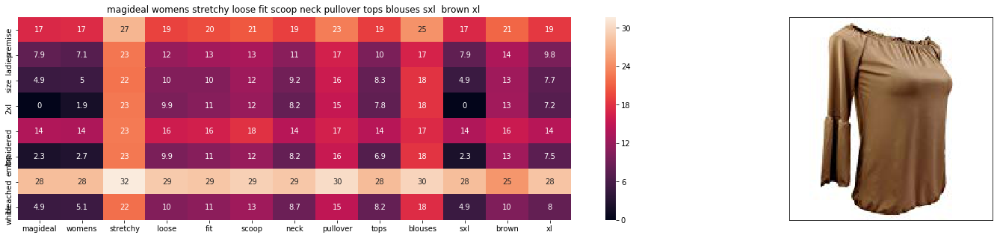

ASIN : B07515JFBF
TITLE :  magideal womens stretchy loose fit scoop neck pullover tops blouses sxl  brown xl 
BRAND :  MagiDeal
COLOR :  Brown
euclidean distance from input : 5.483919200179672


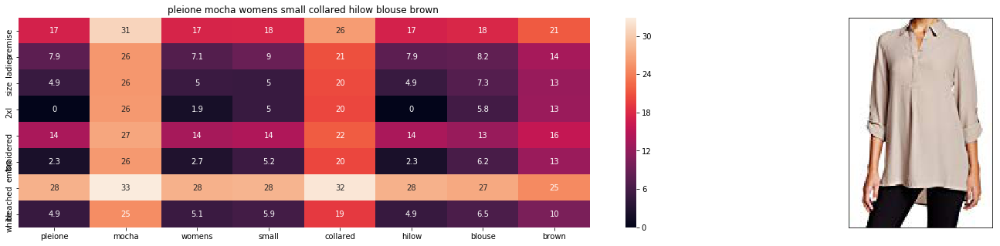

ASIN : B074NBD9C7
TITLE :  pleione mocha womens small collared hilow blouse brown 
BRAND :  Pleione
COLOR :  Brown
euclidean distance from input : 5.491222611490042


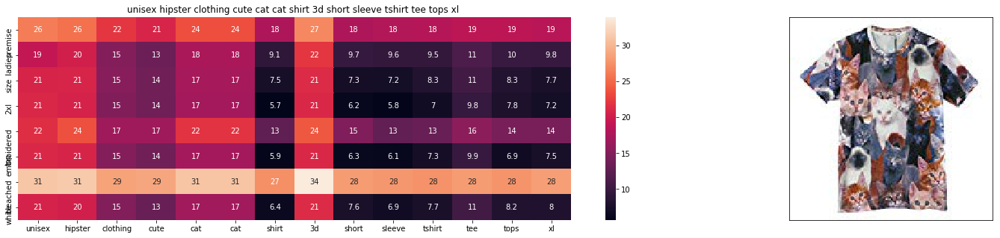

ASIN : B00OM4EF60
TITLE :  unisex hipster clothing cute cat cat shirt 3d short sleeve tshirt tee tops xl 
BRAND :  Moji
COLOR :  Brown
euclidean distance from input : 5.501780999939971


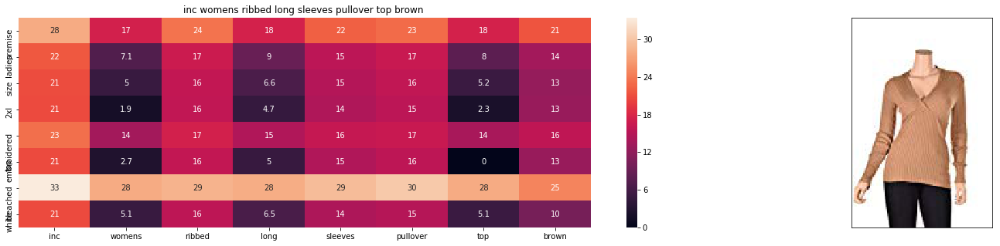

ASIN : B010OVNTHA
TITLE :  inc womens ribbed long sleeves pullover top brown 
BRAND :  INC International Concepts
COLOR :  Brown
euclidean distance from input : 5.525172670278061


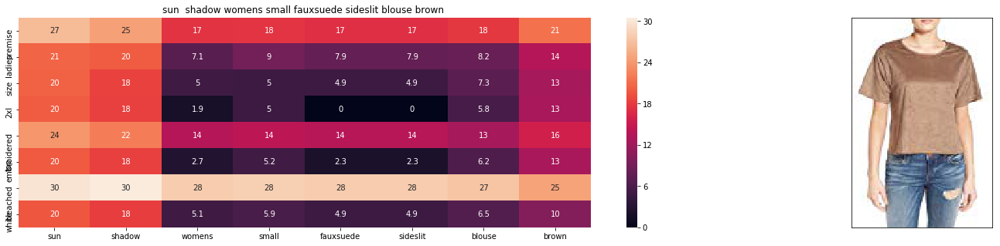

ASIN : B072VG4MV6
TITLE :  sun  shadow womens small fauxsuede sideslit blouse brown 
BRAND :  Sun & Shadow
COLOR :  Brown
euclidean distance from input : 5.547170107349898


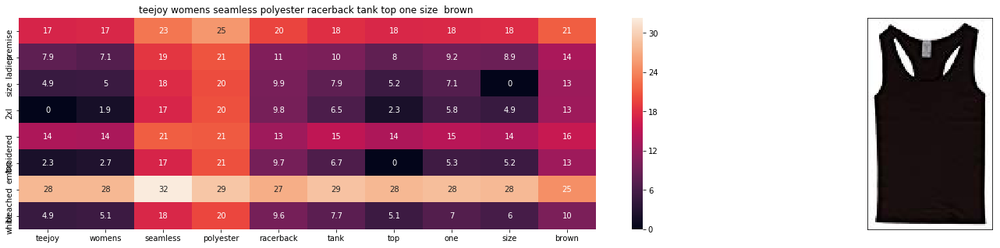

ASIN : B00JPOYCCO
TITLE :  teejoy womens seamless polyester racerback tank top one size  brown 
BRAND :  Sofra
COLOR :  Brown
euclidean distance from input : 5.549962475955004


In [23]:
get_similar_products_cnn(12566,30,28,21,45,8, 20)

## Giving More weight to W4 and some less weight to other features

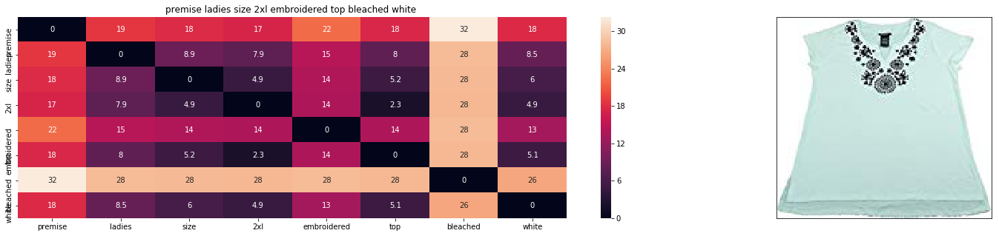

ASIN : B01M0IDUCV
TITLE :  premise ladies size 2xl embroidered top bleached white 
BRAND :  Premise
COLOR :  Bleached White
euclidean distance from input : 2.488926940992458


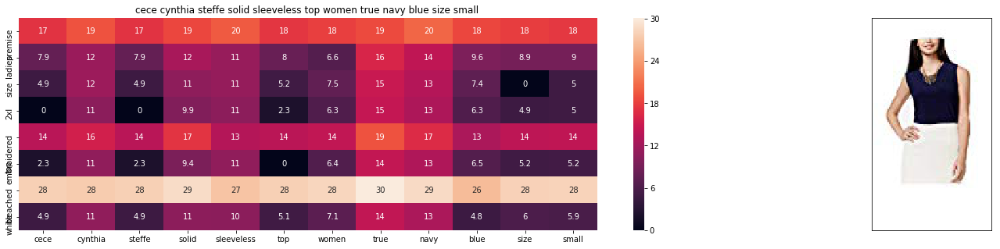

ASIN : B01N4NQ7LX
TITLE :  cece cynthia steffe solid sleeveless top women true navy blue size small 
BRAND :  CeCe by Cynthia Steffe
COLOR :  True Navy
euclidean distance from input : 6.5579398439635


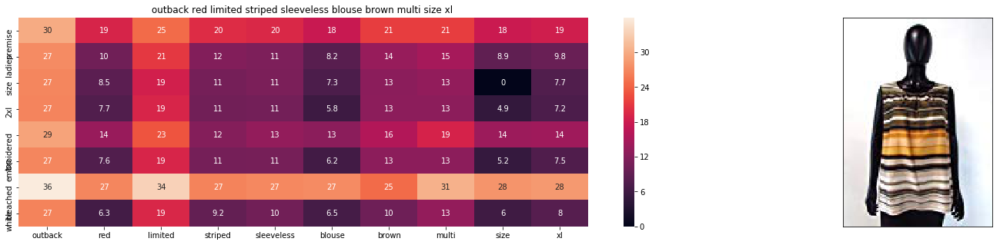

ASIN : B01IU645VU
TITLE :  outback red limited striped sleeveless blouse brown multi size xl 
BRAND :  Outback Red
COLOR :  Brown Stripe
euclidean distance from input : 7.637621911159487


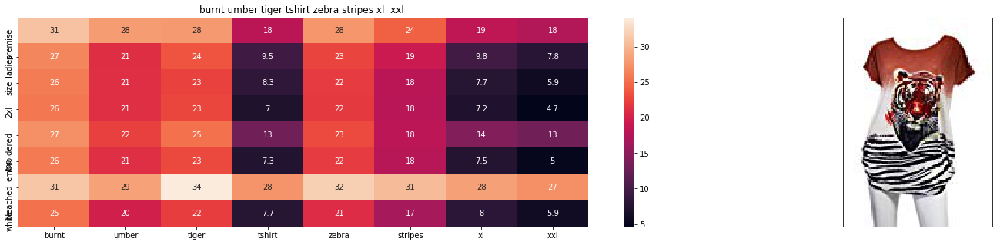

ASIN : B00JXQB5FQ
TITLE :  burnt umber tiger tshirt zebra stripes xl  xxl 
BRAND :  Si Row
COLOR :  Brown
euclidean distance from input : 7.704449197520381


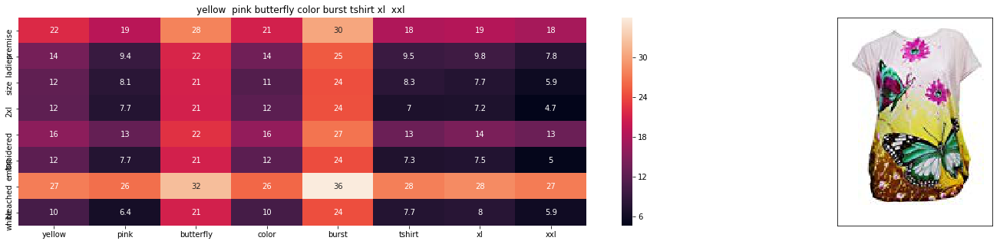

ASIN : B00JXQBBMI
TITLE :  yellow  pink butterfly color burst tshirt xl  xxl 
BRAND :  Si Row
COLOR :  Yellow
euclidean distance from input : 8.182355001824066


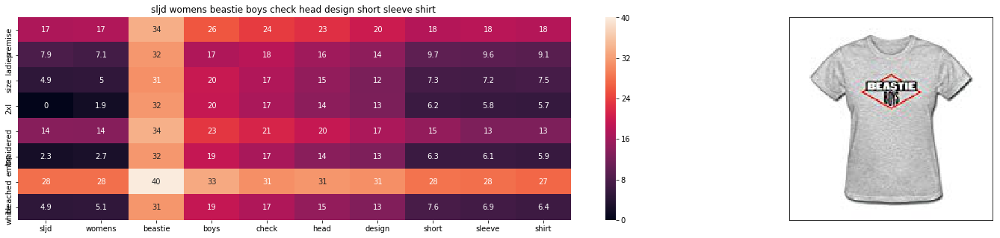

ASIN : B01FQLKKMK
TITLE :  sljd womens beastie boys check head design short sleeve shirt 
BRAND :  SLJD
COLOR :  Grey
euclidean distance from input : 8.21853373287239


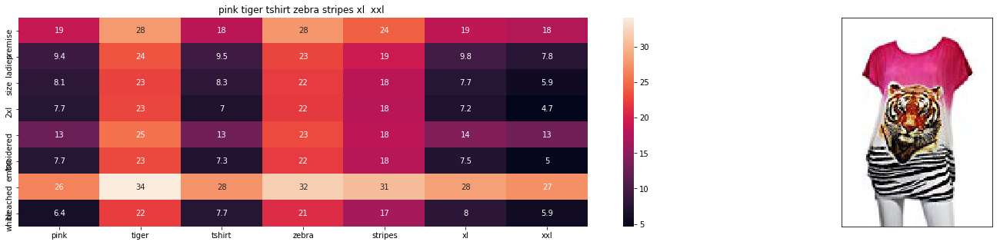

ASIN : B00JXQASS6
TITLE :  pink tiger tshirt zebra stripes xl  xxl 
BRAND :  Si Row
COLOR :  Pink
euclidean distance from input : 8.251854938135207


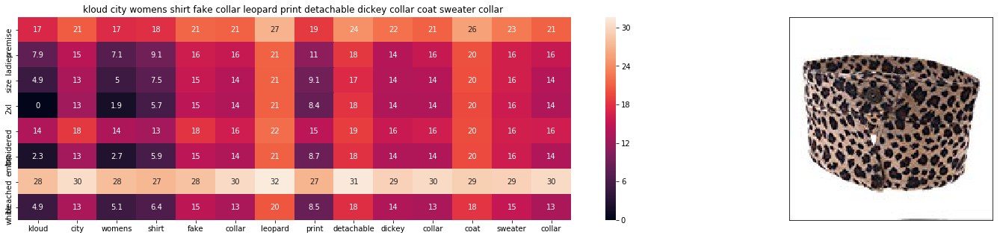

ASIN : B01NBM80SP
TITLE :  kloud city womens shirt fake collar leopard print detachable dickey collar coat sweater collar 
BRAND :  KLOUD City
COLOR :  Brown
euclidean distance from input : 8.341139924491687


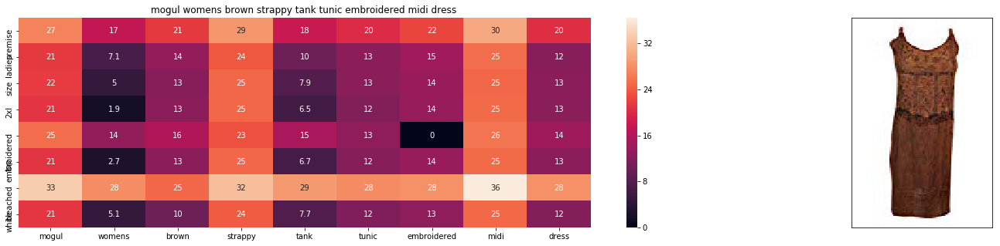

ASIN : B07191F766
TITLE :  mogul womens brown strappy tank tunic embroidered midi dress 
BRAND :  Mogul Interior
COLOR :  Brown
euclidean distance from input : 8.468205301105138


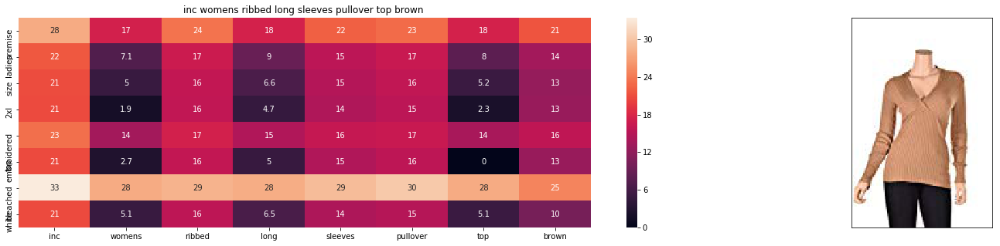

ASIN : B010OVNTHA
TITLE :  inc womens ribbed long sleeves pullover top brown 
BRAND :  INC International Concepts
COLOR :  Brown
euclidean distance from input : 8.497987553875825


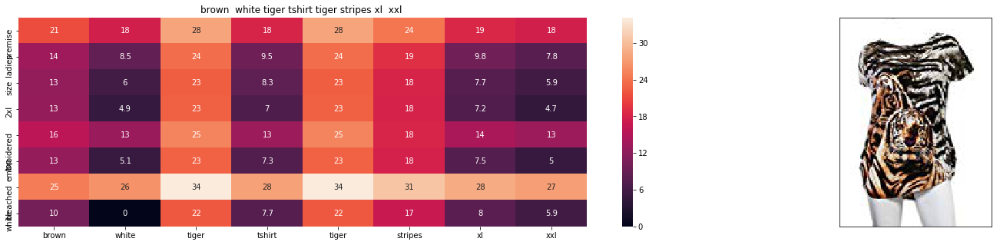

ASIN : B00JXQCWTO
TITLE :  brown  white tiger tshirt tiger stripes xl  xxl 
BRAND :  Si Row
COLOR :  Brown
euclidean distance from input : 8.543087834897248


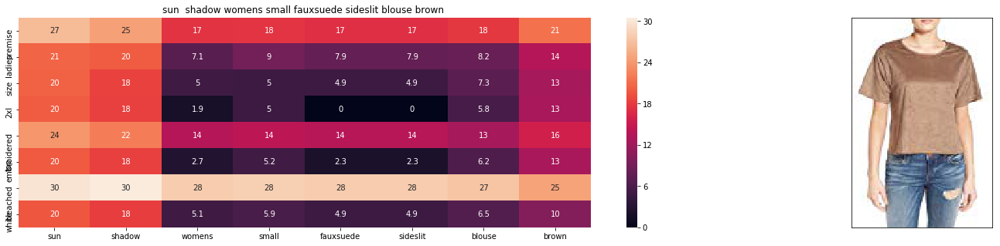

ASIN : B072VG4MV6
TITLE :  sun  shadow womens small fauxsuede sideslit blouse brown 
BRAND :  Sun & Shadow
COLOR :  Brown
euclidean distance from input : 8.55892915152124


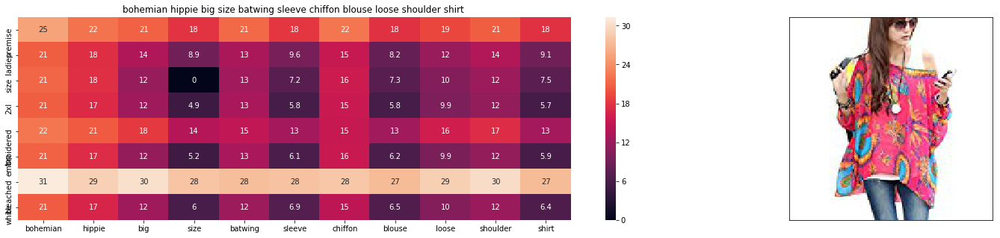

ASIN : B00YC92VRU
TITLE :  bohemian hippie big size batwing sleeve chiffon blouse loose shoulder shirt 
BRAND :  Display Promotion
COLOR :  R
euclidean distance from input : 8.605618923090532


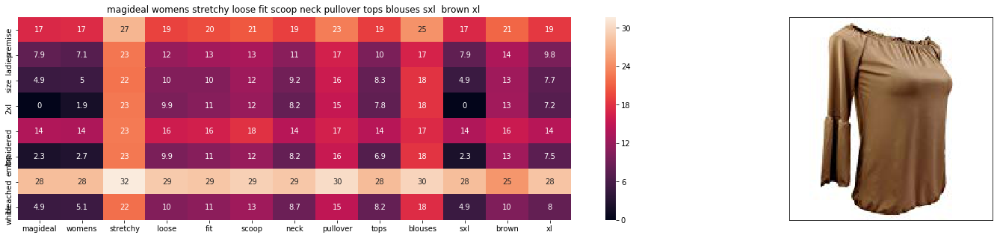

ASIN : B07515JFBF
TITLE :  magideal womens stretchy loose fit scoop neck pullover tops blouses sxl  brown xl 
BRAND :  MagiDeal
COLOR :  Brown
euclidean distance from input : 8.606616220433514


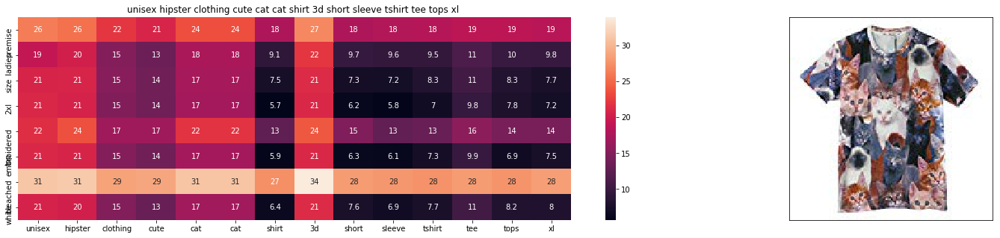

ASIN : B00OM4EF60
TITLE :  unisex hipster clothing cute cat cat shirt 3d short sleeve tshirt tee tops xl 
BRAND :  Moji
COLOR :  Brown
euclidean distance from input : 8.653922447080934


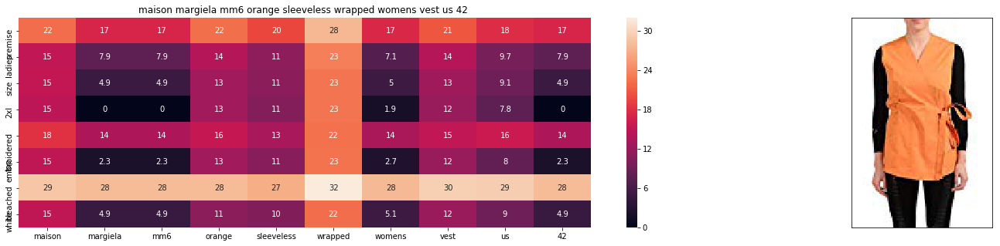

ASIN : B01MXI5L4G
TITLE :  maison margiela mm6 orange sleeveless wrapped womens vest us 42 
BRAND :  Maison Margiela MM6
COLOR :  Orange
euclidean distance from input : 8.665657231735898


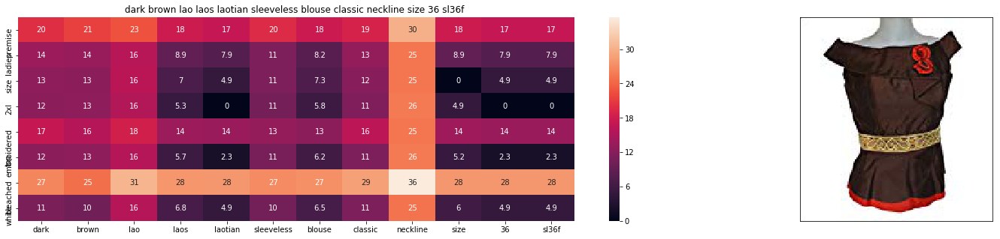

ASIN : B074J7BCYM
TITLE :  dark brown lao laos laotian sleeveless blouse classic neckline size 36 sl36f 
BRAND :  Nanon
COLOR :  Brown
euclidean distance from input : 8.670935068089765


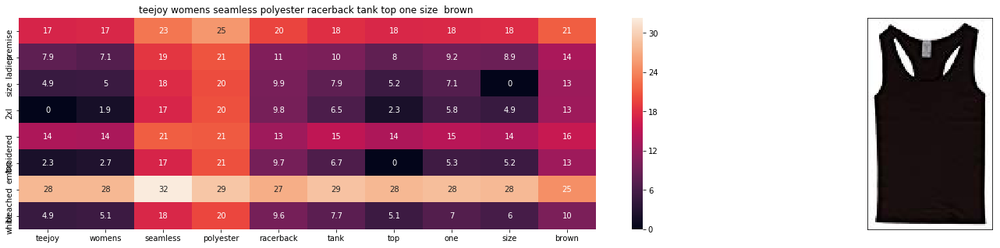

ASIN : B00JPOYCCO
TITLE :  teejoy womens seamless polyester racerback tank top one size  brown 
BRAND :  Sofra
COLOR :  Brown
euclidean distance from input : 8.68749801921918


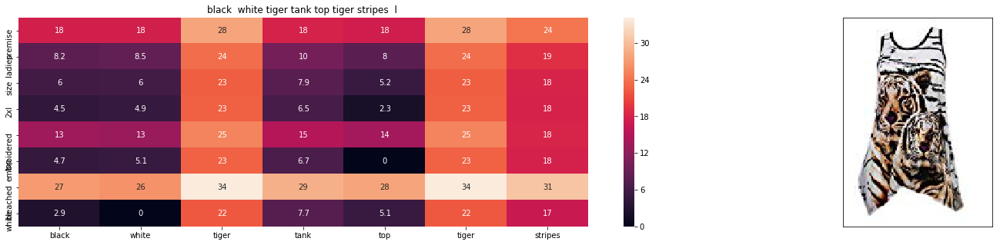

ASIN : B00JXQAO94
TITLE :  black  white tiger tank top tiger stripes  l 
BRAND :  Si Row
COLOR :  White
euclidean distance from input : 8.688501109373318


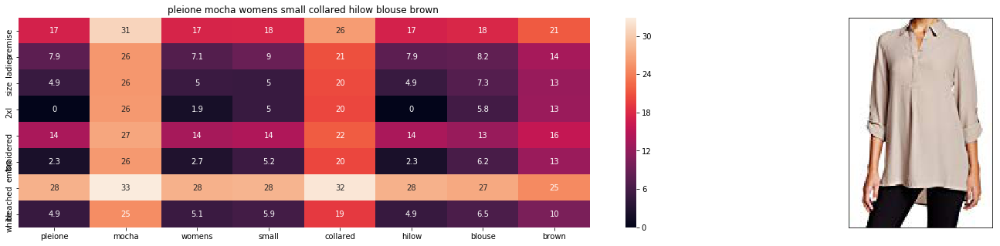

ASIN : B074NBD9C7
TITLE :  pleione mocha womens small collared hilow blouse brown 
BRAND :  Pleione
COLOR :  Brown
euclidean distance from input : 8.702533499220879


In [24]:
get_similar_products_cnn(12566,20,18,22,40,15, 20)

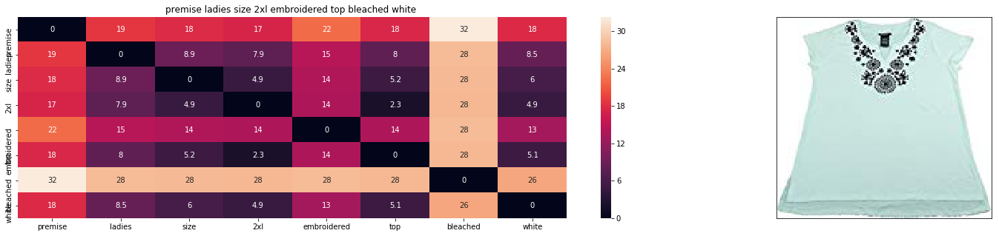

ASIN : B01M0IDUCV
TITLE :  premise ladies size 2xl embroidered top bleached white 
BRAND :  Premise
COLOR :  Bleached White
euclidean distance from input : 2.0533919477136204


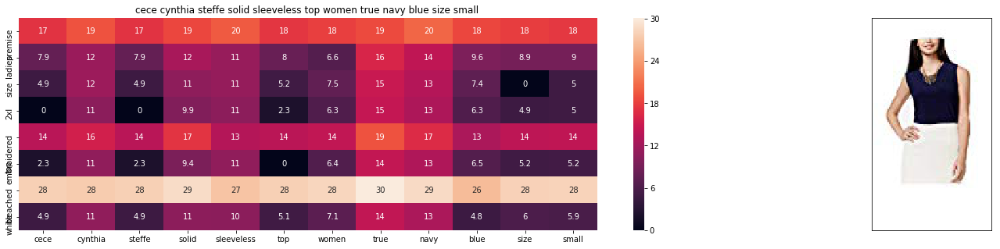

ASIN : B01N4NQ7LX
TITLE :  cece cynthia steffe solid sleeveless top women true navy blue size small 
BRAND :  CeCe by Cynthia Steffe
COLOR :  True Navy
euclidean distance from input : 13.945249248188059


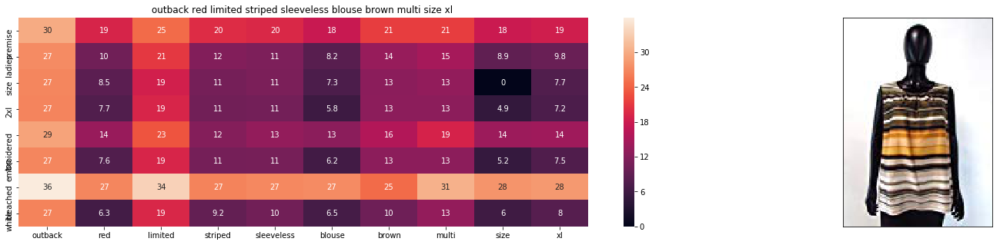

ASIN : B01IU645VU
TITLE :  outback red limited striped sleeveless blouse brown multi size xl 
BRAND :  Outback Red
COLOR :  Brown Stripe
euclidean distance from input : 18.140512323863287


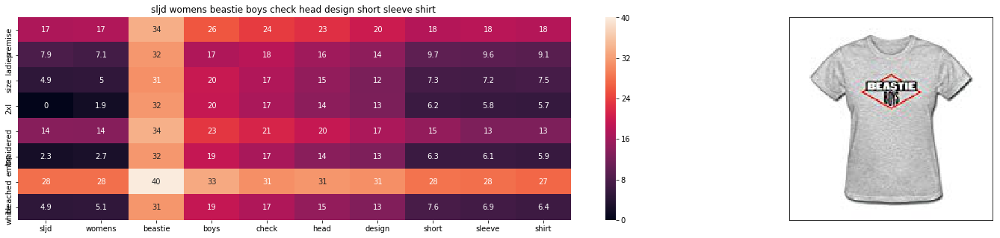

ASIN : B01FQLKKMK
TITLE :  sljd womens beastie boys check head design short sleeve shirt 
BRAND :  SLJD
COLOR :  Grey
euclidean distance from input : 19.327918153421802


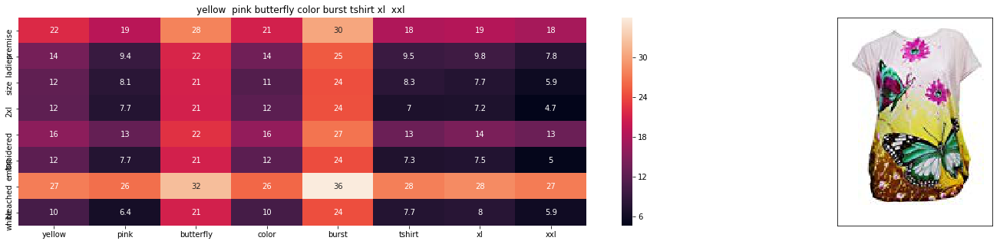

ASIN : B00JXQBBMI
TITLE :  yellow  pink butterfly color burst tshirt xl  xxl 
BRAND :  Si Row
COLOR :  Yellow
euclidean distance from input : 20.626824553147934


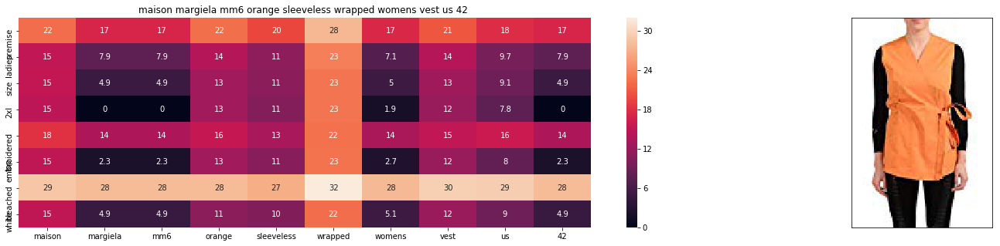

ASIN : B01MXI5L4G
TITLE :  maison margiela mm6 orange sleeveless wrapped womens vest us 42 
BRAND :  Maison Margiela MM6
COLOR :  Orange
euclidean distance from input : 20.657386039173893


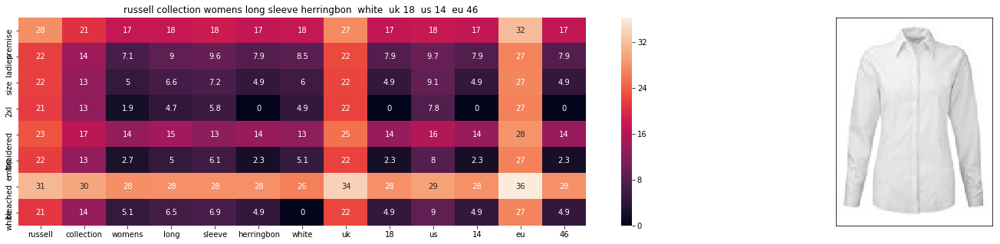

ASIN : B00K77AN5S
TITLE :  russell collection womens long sleeve herringbon  white  uk 18  us 14  eu 46 
BRAND :  Russell Collection
COLOR :  White
euclidean distance from input : 20.8047414764083


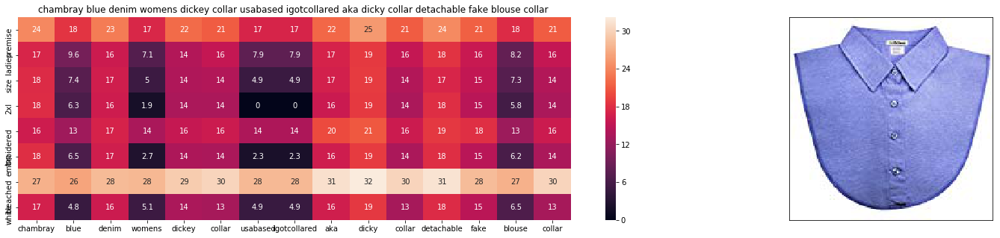

ASIN : B01MQWKWME
TITLE :  chambray blue denim womens dickey collar usabased igotcollared aka dicky collar detachable fake blouse collar 
BRAND :  IGotCollared
COLOR :  Chambray Blue Denim
euclidean distance from input : 20.81718963245797


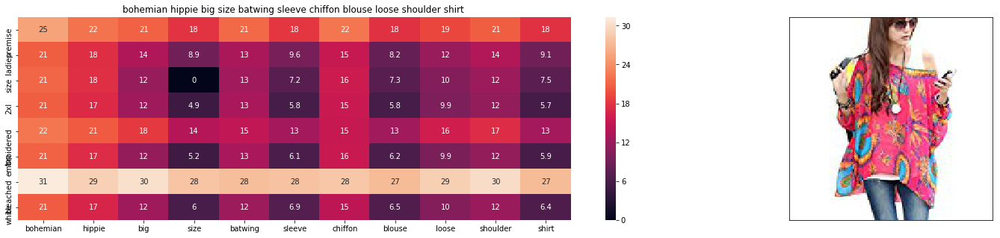

ASIN : B00YC92VRU
TITLE :  bohemian hippie big size batwing sleeve chiffon blouse loose shoulder shirt 
BRAND :  Display Promotion
COLOR :  R
euclidean distance from input : 20.8786233388514


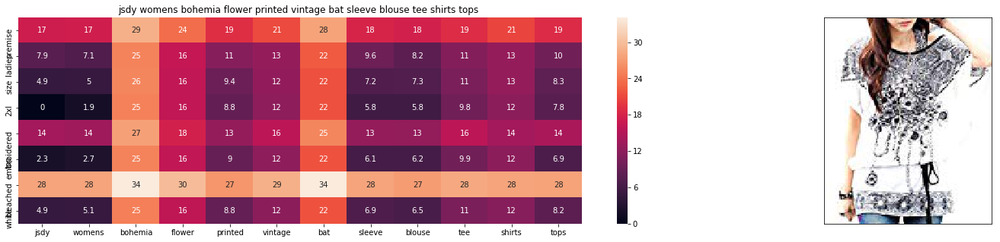

ASIN : B00L8RE3PC
TITLE :  jsdy womens bohemia flower printed vintage bat sleeve blouse tee shirts tops 
BRAND :  JSDY-Cloth
COLOR :  White
euclidean distance from input : 20.933186910978613


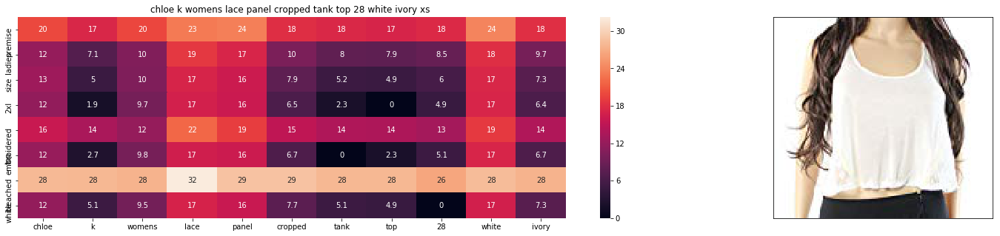

ASIN : B071VZCT5W
TITLE :  chloe k womens lace panel cropped tank top 28 white ivory xs 
BRAND :  Chloe K.
COLOR :  White Ivory
euclidean distance from input : 20.935842615385155


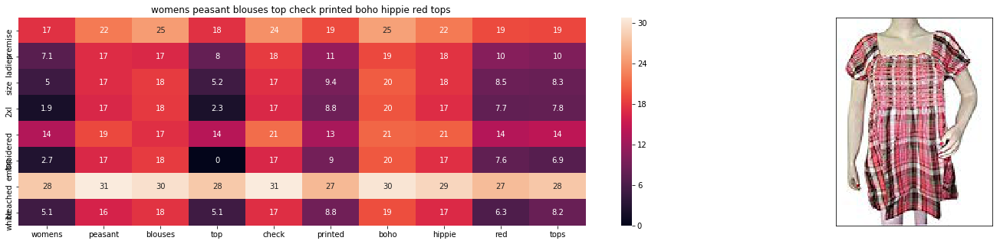

ASIN : B01MXMG6KB
TITLE :  womens peasant blouses top check printed boho hippie red tops 
BRAND :  Mogul Interior
COLOR :  Red
euclidean distance from input : 20.95499543573235


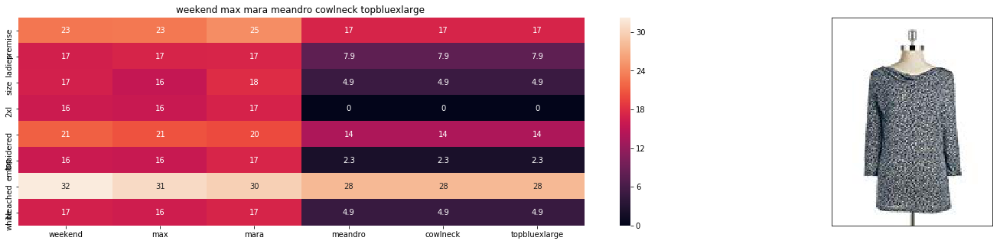

ASIN : B01MG83UB4
TITLE :  weekend max mara meandro cowlneck topbluexlarge 
BRAND :  MaxMara
COLOR :  Blue
euclidean distance from input : 20.959199732480904


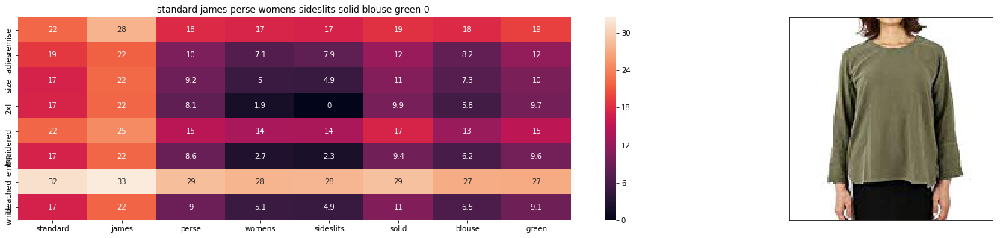

ASIN : B071LMW4YG
TITLE :  standard james perse womens sideslits solid blouse green 0 
BRAND :  Standard James Perse
COLOR :  Green
euclidean distance from input : 21.017938885004394


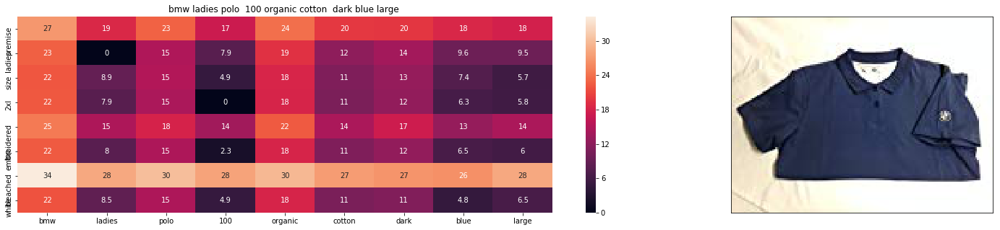

ASIN : B0060MKVX8
TITLE :  bmw ladies polo  100 organic cotton  dark blue large 
BRAND :  None
COLOR :  Blue
euclidean distance from input : 21.021649541540775


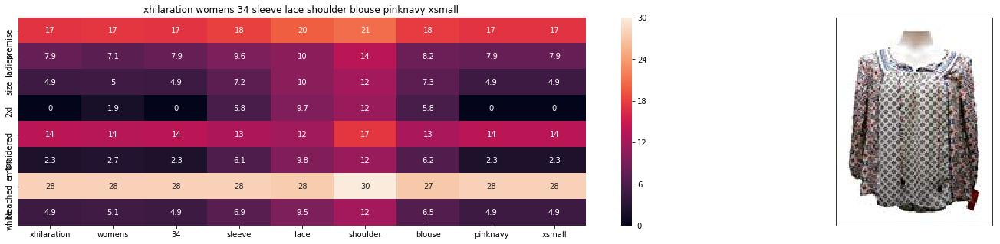

ASIN : B06ZYLKPRT
TITLE :  xhilaration womens 34 sleeve lace shoulder blouse pinknavy xsmall 
BRAND :  Xhilaration
COLOR :  , Pink/Navy,
euclidean distance from input : 21.0375494767982


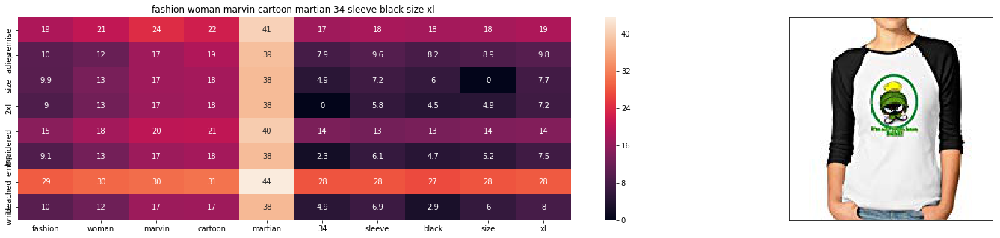

ASIN : B01FRPIX2Y
TITLE :  fashion woman marvin cartoon martian 34 sleeve black size xl 
BRAND :  LOVELIF Sleeve Raglan
COLOR :  Black
euclidean distance from input : 21.076065848744207


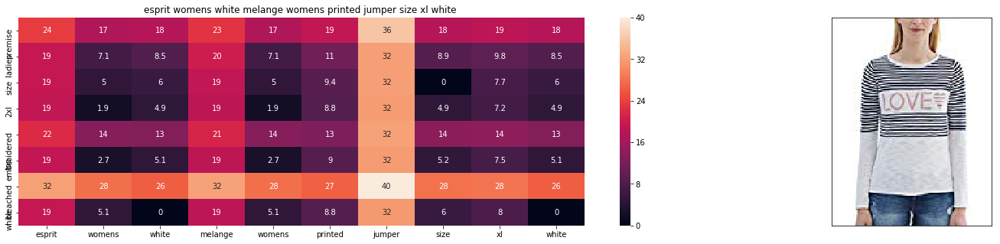

ASIN : B01MSZ1EO7
TITLE :  esprit womens white melange womens printed jumper size xl white 
BRAND :  Esprit
COLOR :  110 Off White
euclidean distance from input : 21.104981805097236


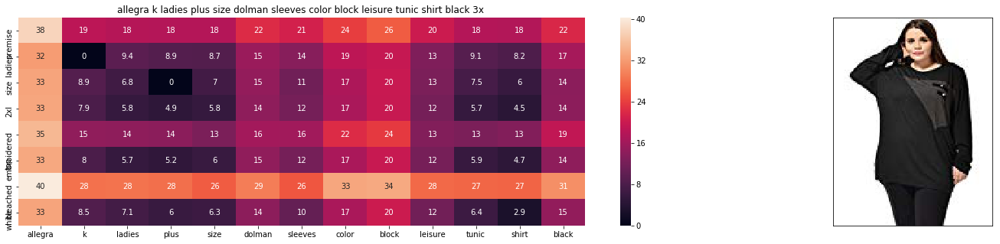

ASIN : B00D2J5HPO
TITLE :  allegra k ladies plus size dolman sleeves color block leisure tunic shirt black 3x 
BRAND :  Kaia
COLOR :  Black
euclidean distance from input : 21.10534841412153


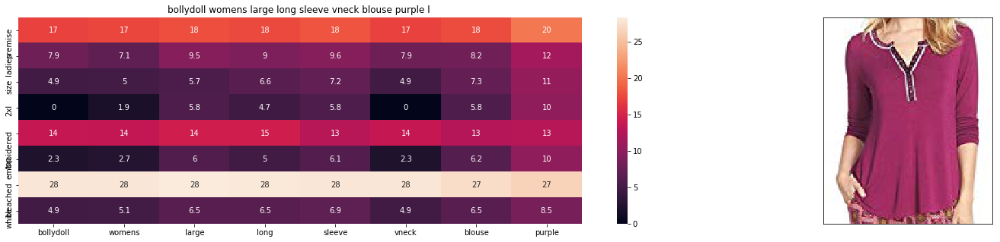

ASIN : B074MJPLCB
TITLE :  bollydoll womens large long sleeve vneck blouse purple l 
BRAND :  BollyDoll
COLOR :  Purple
euclidean distance from input : 21.10859840350672


In [25]:
get_similar_products_cnn(12566,20,18,22,10,45, 20)

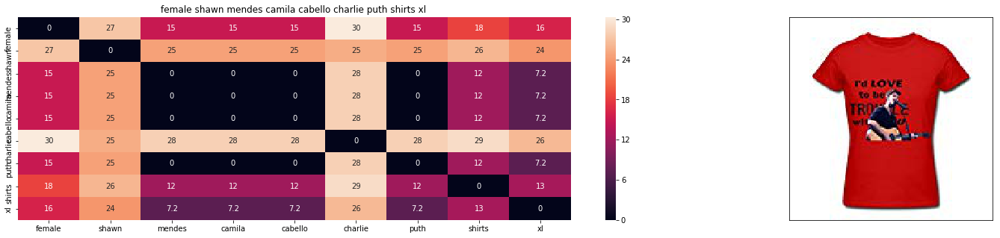

ASIN : B01HPDY956
TITLE :  female shawn mendes camila cabello charlie puth shirts xl 
BRAND :  Xuguanghui
COLOR :  Red
euclidean distance from input : 2.001100197802558


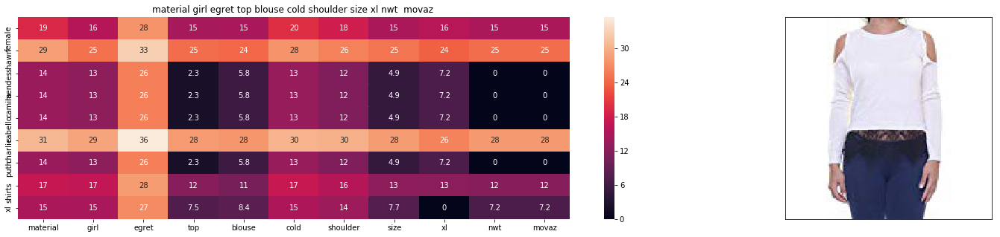

ASIN : B06XHNQ15S
TITLE :  material girl egret top blouse cold shoulder size xl nwt  movaz 
BRAND :  Material Girl
COLOR :  Egret
euclidean distance from input : 4.427789568901062


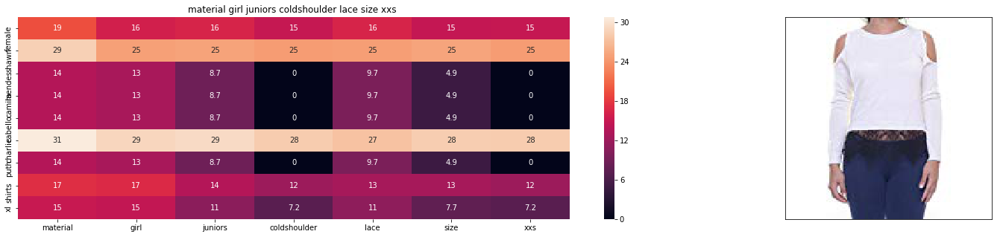

ASIN : B06XDX9YXP
TITLE :  material girl juniors coldshoulder lace size xxs 
BRAND :  Material Girl
COLOR :  Egret
euclidean distance from input : 4.601721326510112


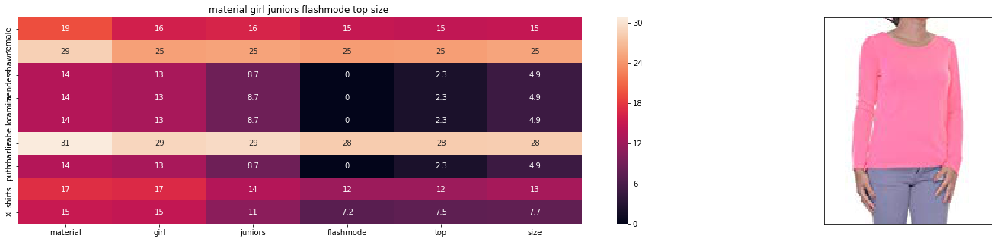

ASIN : B06XY2Z95T
TITLE :  material girl juniors flashmode top size 
BRAND :  Material Girl
COLOR :  Flashmode
euclidean distance from input : 4.638144215023305


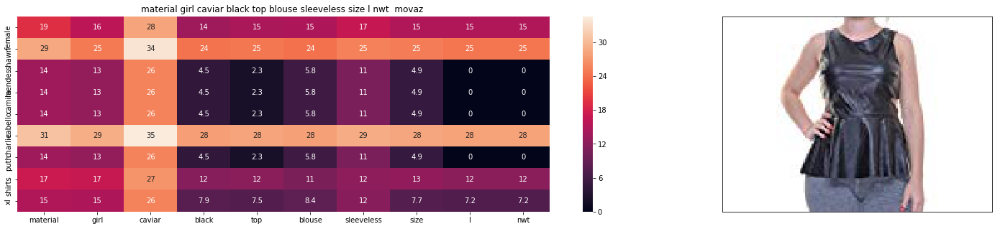

ASIN : B06XGMGZNG
TITLE :  material girl caviar black top blouse sleeveless size l nwt  movaz 
BRAND :  Material Girl
COLOR :  Caviar Black
euclidean distance from input : 4.673432451009222


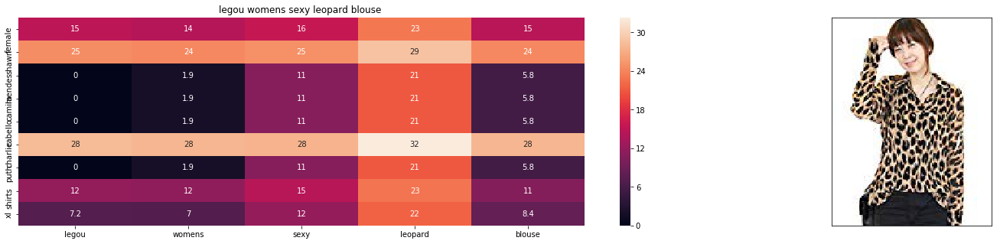

ASIN : B0142HAASS
TITLE :  legou womens sexy leopard blouse 
BRAND :  Legou
COLOR :  As Pictures
euclidean distance from input : 4.704605401337299


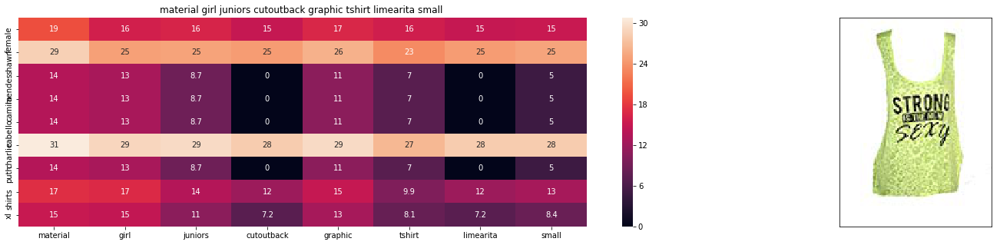

ASIN : B06ZZWMPTF
TITLE :  material girl juniors cutoutback graphic tshirt limearita small 
BRAND :  Material Girl
COLOR :  Limearita
euclidean distance from input : 4.713398655330923


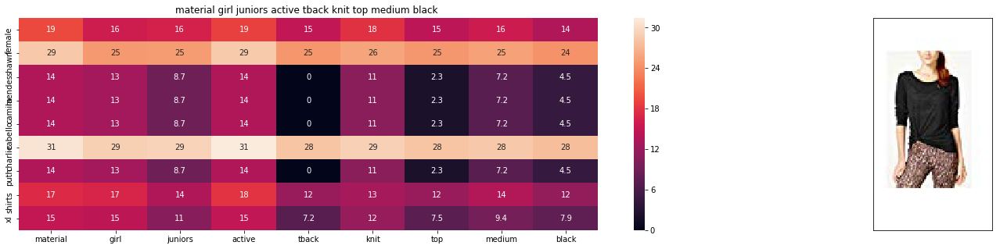

ASIN : B06XKZL1QG
TITLE :  material girl juniors active tback knit top medium black 
BRAND :  Material Girl
COLOR :  Black
euclidean distance from input : 4.714953541830963


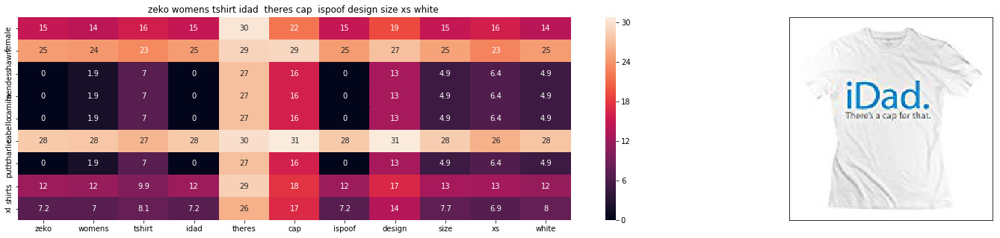

ASIN : B011TZT2AS
TITLE :  zeko womens tshirt idad  theres cap  ispoof design size xs white 
BRAND :  ZEKO
COLOR :  White
euclidean distance from input : 4.745384414331586


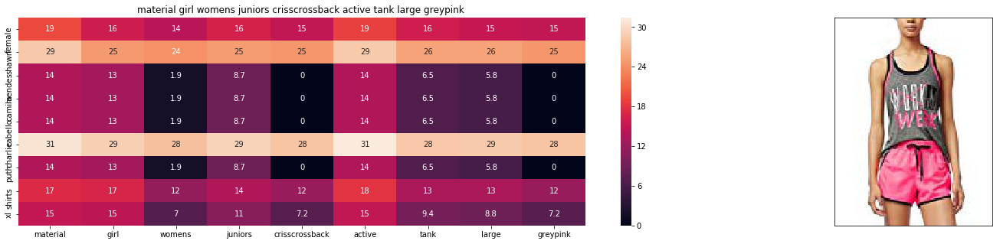

ASIN : B0722MVMKW
TITLE :  material girl womens juniors crisscrossback active tank large greypink 
BRAND :  Material Girl
COLOR :  Pink
euclidean distance from input : 4.746659159735626


In [26]:
get_similar_products_cnn(13000,20,99,18,40,15,10)

## 8.Conclusion


I had builded idfword2vec on Text concatinating all remaining features (Text,color,Image,Brand) by one hot encoding. Building weighted euclidean distance based similarity.






Steps Involved

1) Importing libraries

2) Loading data file (Already i had done deduplication,text preprocessing,stemming etc)

3) Featurizing data by IDFw2vec on Text features(title)

4) Doing one hot encoding for (Text, Brand,Color,Image)

5) Giving weight for Text,Brand,Color,Image.(Trying Multiple Weights)

6) Building weighted eucledian distance based similarity.